# COSMOS master catalogue
## Checks and diagnostics

In [1]:
from herschelhelp_internal import git_version
print("This notebook was run with herschelhelp_internal version: \n{}".format(git_version()))
import datetime
print("This notebook was executed on: \n{}".format(datetime.datetime.now()))

This notebook was run with herschelhelp_internal version: 
0246c5d (Thu Jan 25 17:01:47 2018 +0000) [with local modifications]
This notebook was executed on: 
2018-02-14 15:13:04.331992


In [2]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import locale
locale.setlocale(locale.LC_ALL, 'en_GB')

import os
import time
import itertools

from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy import units as u
from astropy import visualization as vis
import numpy as np
from matplotlib_venn import venn3, venn2

from herschelhelp_internal.masterlist import nb_compare_mags, nb_ccplots, nb_histograms, quick_checks, find_last_ml_suffix

/Users/rs548/anaconda/envs/herschelhelp_internal/lib/python3.6/site-packages/seaborn/apionly.py:6: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)


In [3]:
OUT_DIR = os.environ.get('OUT_DIR', "./data")
SUFFIX = find_last_ml_suffix()
#SUFFIX = "_20170815"

master_catalogue = Table.read("{}/master_catalogue_cosmos_{}.fits".format(OUT_DIR, SUFFIX))

## 0 - Quick checks

In [4]:
quick_checks(master_catalogue).show_in_notebook()

Table shows only problematic columns.


idx,Column,All nan,#Measurements,#Zeros,#Negative,Minimum value
0,f_ap_vista_ks,False,119119,0,2247,-0.100043997169
1,merr_ap_vista_ks,False,119119,0,2247,-128767.820312
2,f_ap_vista_y,False,120582,0,712,-0.035123500973
3,merr_ap_vista_y,False,120582,0,712,-8020.80322266
4,f_ap_vista_h,False,119809,0,1590,-0.0569436997175
5,merr_ap_vista_h,False,119809,0,1590,-6273.43945312
6,f_ap_vista_j,False,120574,0,838,-0.0413101017475
7,merr_ap_vista_j,False,120574,0,838,-12964.640625
8,f_ap_suprime_b,False,121078,0,1815,-0.0358280986547
9,merr_ap_suprime_b,False,121078,0,1815,-39496.5351562


## I - Summary of wavelength domains

In [5]:
flag_obs = master_catalogue['flag_optnir_obs']
flag_det = master_catalogue['flag_optnir_det']

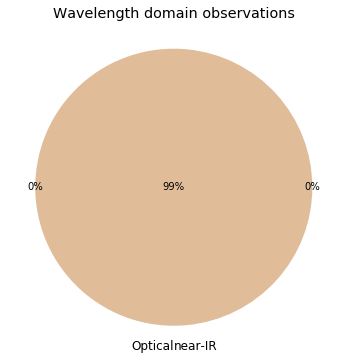

In [6]:
venn2(
    [
        np.sum(flag_obs == 1),
        np.sum(flag_obs == 2),
        np.sum(flag_obs == 3)
    ],
    set_labels=('Optical', 'near-IR'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/len(flag_obs)))
)
plt.title("Wavelength domain observations");

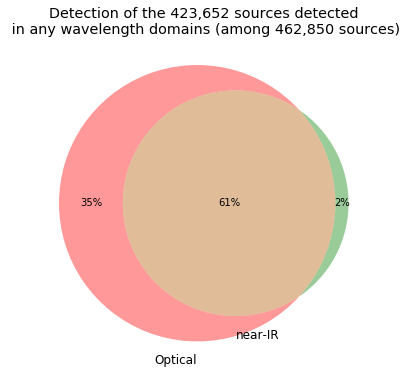

In [7]:
venn2(
    [
        np.sum(flag_det[flag_obs == 3] == 1),
        np.sum(flag_det[flag_obs == 3] == 2),
        np.sum(flag_det[flag_obs == 3] == 3)
    ],
    set_labels=('Optical', 'near-IR'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/np.sum(flag_det != 0)))
)
plt.title("Detection of the {} sources detected\n in any wavelength domains "
          "(among {} sources)".format(
              locale.format('%d', np.sum(flag_det != 0), grouping=True),
              locale.format('%d', len(flag_det), grouping=True)));

## II - Comparing magnitudes in similar filters

The master list if composed of several catalogues containing magnitudes in similar filters on different instruments. We are comparing the magnitudes in these corresponding filters.

In [8]:
u_bands = ["Megacam u",            "OMEGACam u"]
g_bands = ["Megacam g", "DECam g", "OMEGACam g", "SUPRIME g", "GPC1 g"]
r_bands = ["Megacam r", "DECam r", "OMEGACam r", "SUPRIME r", "GPC1 r"]
i_bands = ["Megacam i",            "OMEGACam i", "SUPRIME i", "GPC1 i"]
z_bands = ["Megacam z", "DECam z",               "SUPRIME z", "GPC1 z"]
y_bands = [                                      "SUPRIME y", "GPC1 y", "UKIDSS Y"]
j_bands = ["VISTA J",  "WIRCam J",  "UKIDSS J"  ]
h_bands = ["VISTA H",  "WIRCam H",  "UKIDSS H"  ]
k_bands = ["VISTA Ks", "WIRCam Ks", "UKIDSS K"  ]

### II.a - Comparing depths

We compare the histograms of the total aperture magnitudes of similar bands.

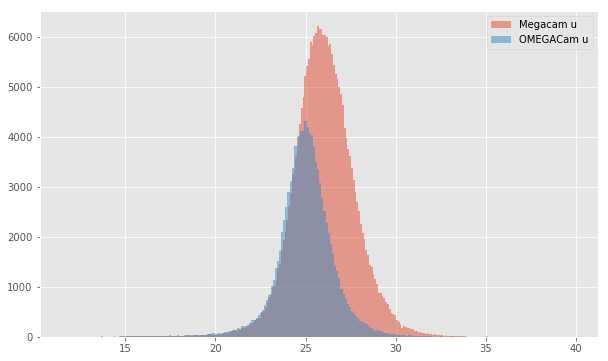

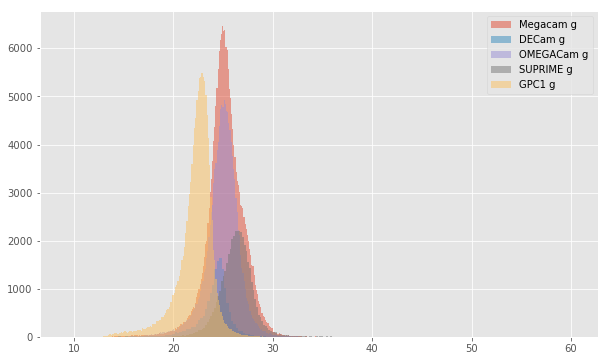

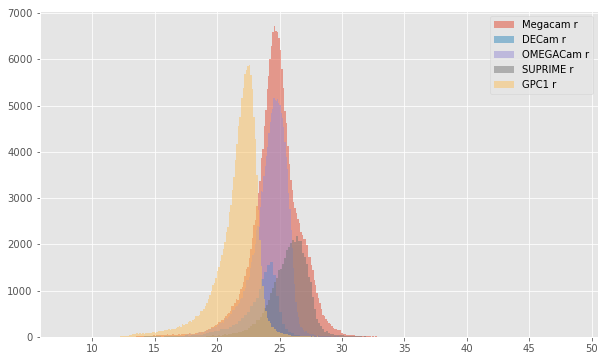

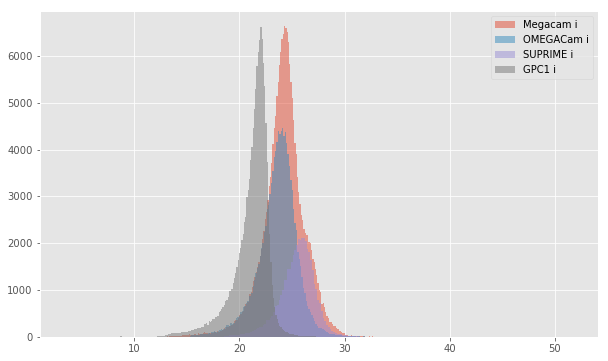

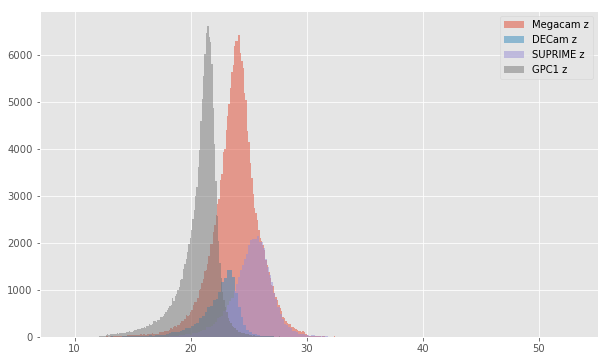

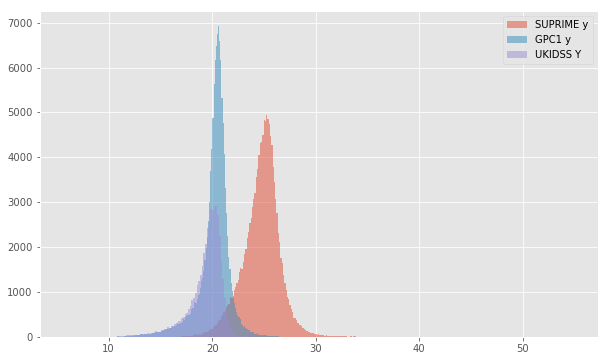

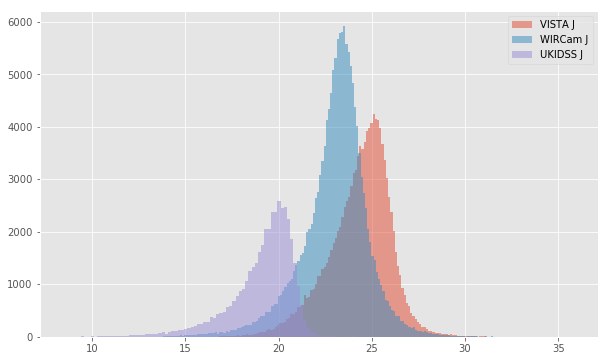

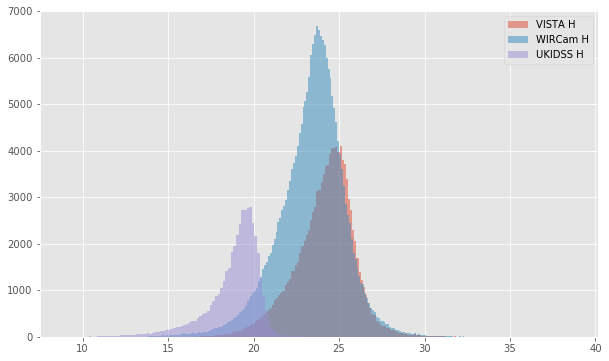

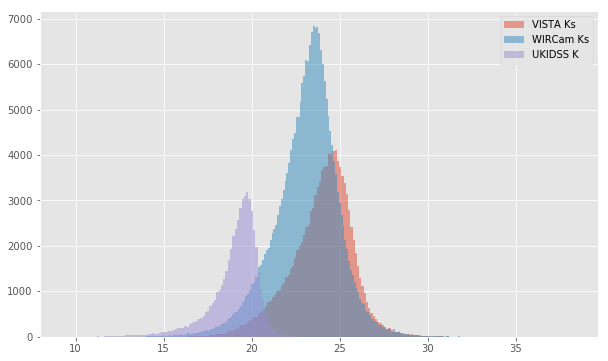

In [9]:
for bands in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, j_bands, h_bands, k_bands]:
    colnames = ["m_{}".format(band.replace(" ", "_").lower()) for band in bands]
    nb_histograms(master_catalogue, colnames, bands)

### II.b - Comparing magnitudes

We compare one to one each magnitude in similar bands.

OMEGACam u (aperture) - Megacam u (aperture):
- Median: -0.14
- Median Absolute Deviation: 0.36
- 1% percentile: -2.583023109436035
- 99% percentile: 2.3451877403259314


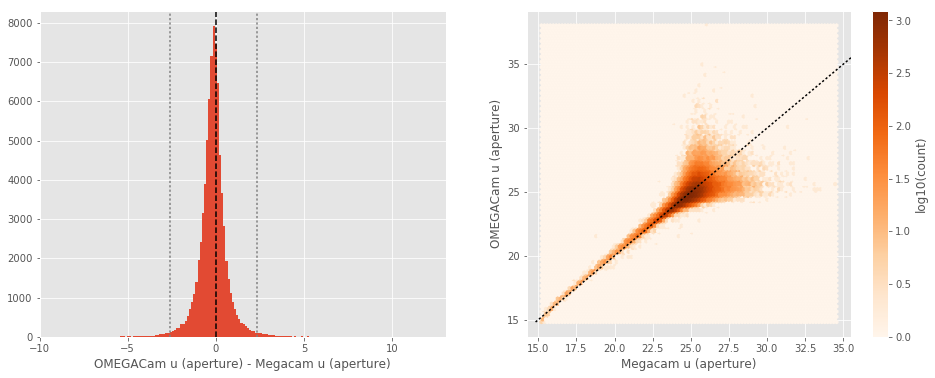

OMEGACam u (total) - Megacam u (total):
- Median: 0.19
- Median Absolute Deviation: 0.43
- 1% percentile: -2.298335456848145
- 99% percentile: 3.4119881439208974


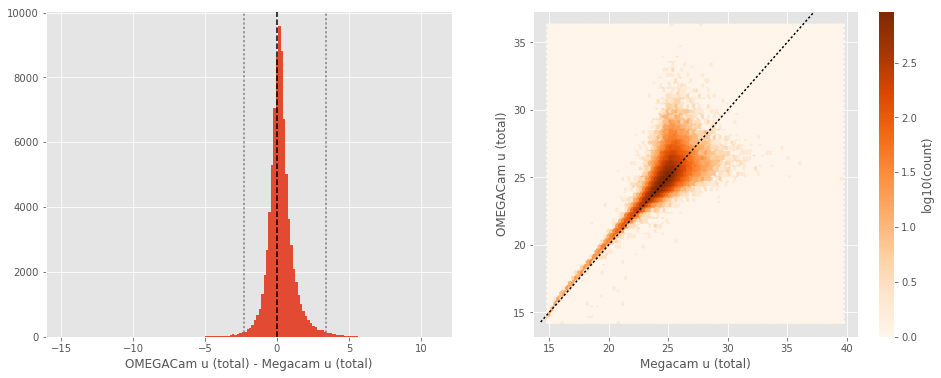

DECam g (aperture) - Megacam g (aperture):
- Median: -0.17
- Median Absolute Deviation: 0.28
- 1% percentile: -1.4425120544433594
- 99% percentile: 2.493613357543944


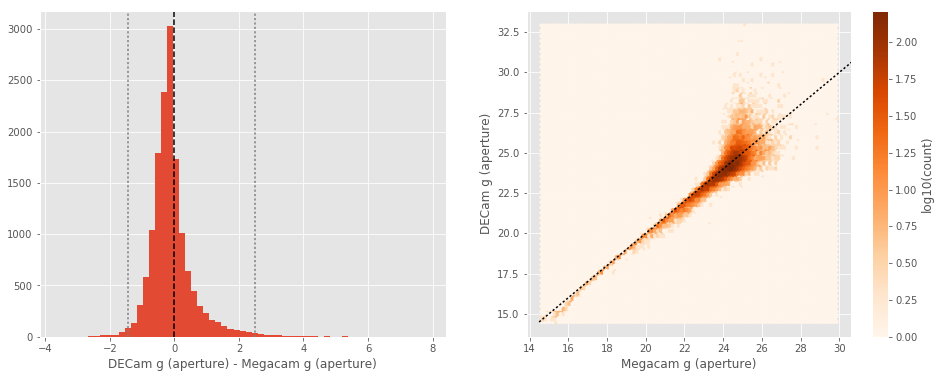

DECam g (total) - Megacam g (total):
- Median: 0.22
- Median Absolute Deviation: 0.19
- 1% percentile: -0.5151098632812499
- 99% percentile: 2.3817656707763692


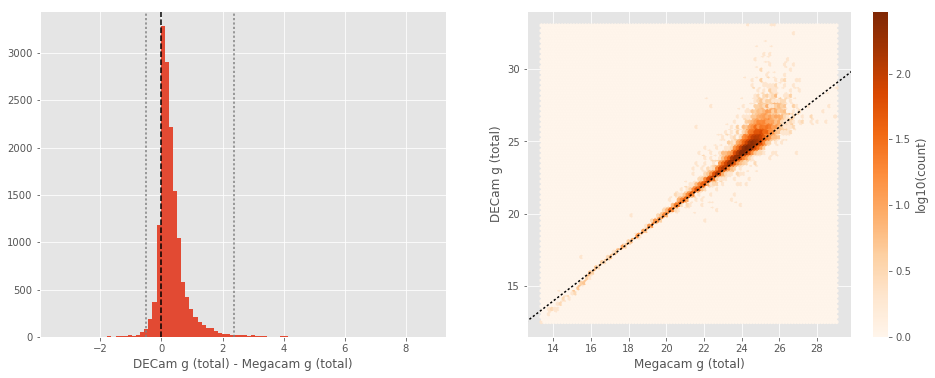

OMEGACam g (aperture) - Megacam g (aperture):
- Median: 0.01
- Median Absolute Deviation: 0.16
- 1% percentile: -0.8732880973815917
- 99% percentile: 1.727949829101566


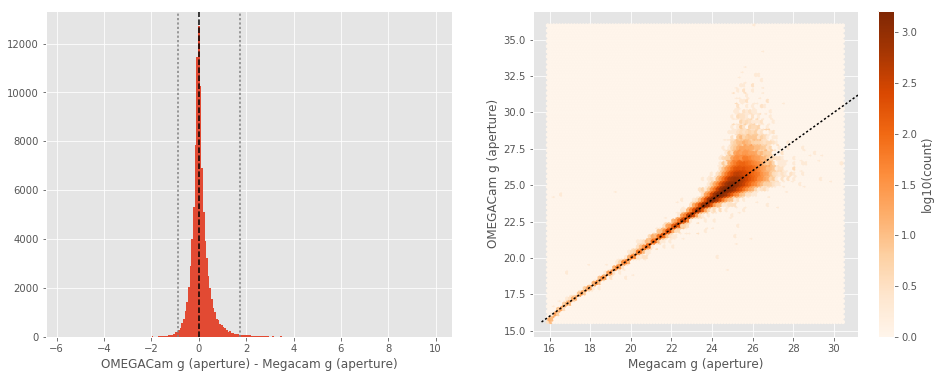

OMEGACam g (total) - Megacam g (total):
- Median: 0.42
- Median Absolute Deviation: 0.25
- 1% percentile: -0.5195956802368163
- 99% percentile: 2.9587287139892577


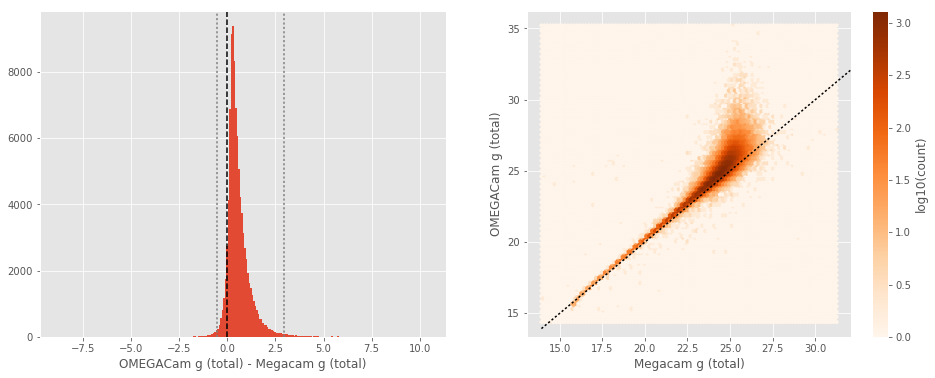

SUPRIME g (aperture) - Megacam g (aperture):
- Median: -0.12
- Median Absolute Deviation: 0.10
- 1% percentile: -1.112451286315918
- 99% percentile: 5.67503015518194


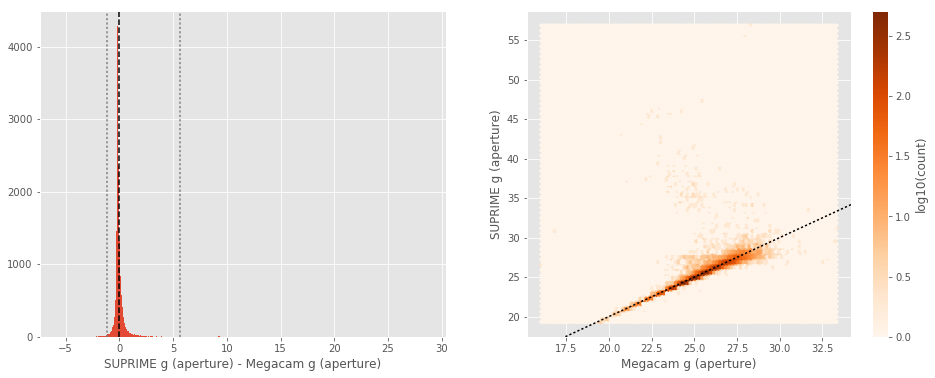

SUPRIME g (total) - Megacam g (total):
- Median: -0.02
- Median Absolute Deviation: 0.16
- 1% percentile: -1.8830352020263672
- 99% percentile: 3.4730355072021486


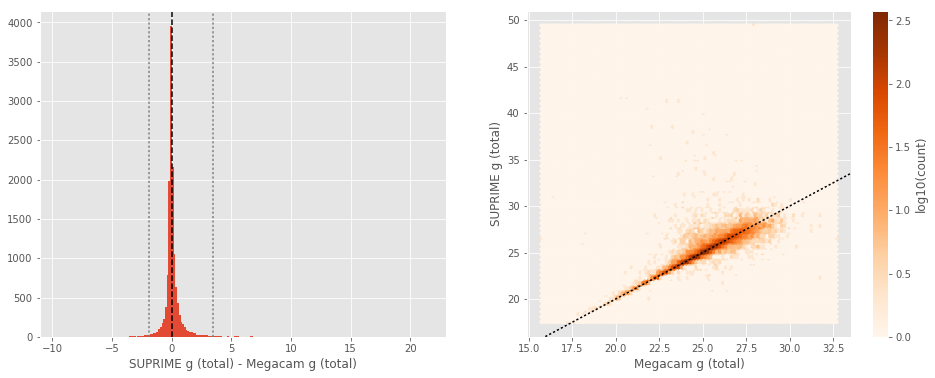

GPC1 g (aperture) - Megacam g (aperture):
- Median: -0.38
- Median Absolute Deviation: 0.39
- 1% percentile: -3.0744721603393557
- 99% percentile: 2.5295969009399495


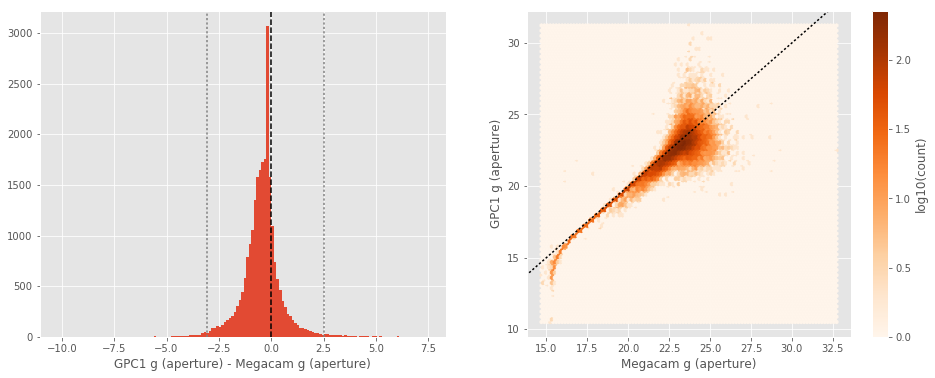

GPC1 g (total) - Megacam g (total):
- Median: 0.06
- Median Absolute Deviation: 0.28
- 1% percentile: -3.284444046020508
- 99% percentile: 2.2227920532226615


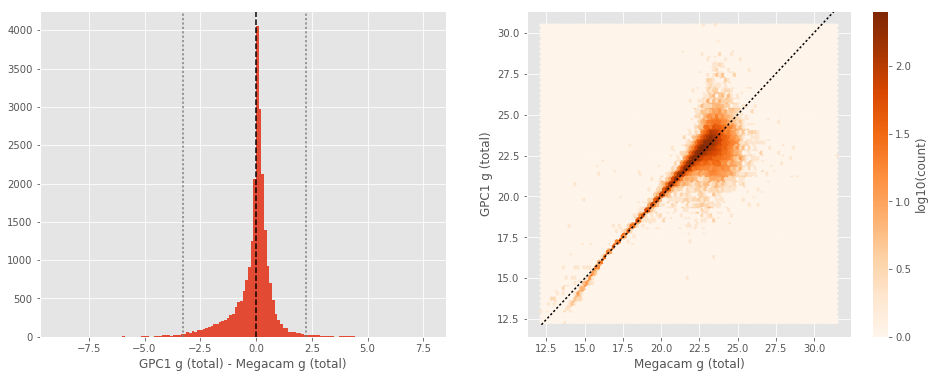

OMEGACam g (aperture) - DECam g (aperture):
- Median: 0.26
- Median Absolute Deviation: 0.30
- 1% percentile: -2.437233428955078
- 99% percentile: 1.915738983154297


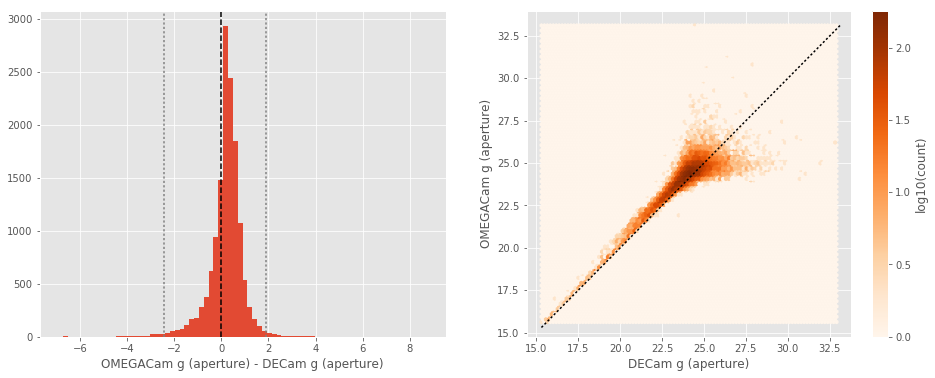

OMEGACam g (total) - DECam g (total):
- Median: 0.18
- Median Absolute Deviation: 0.24
- 1% percentile: -1.585318794250488
- 99% percentile: 2.048850784301755


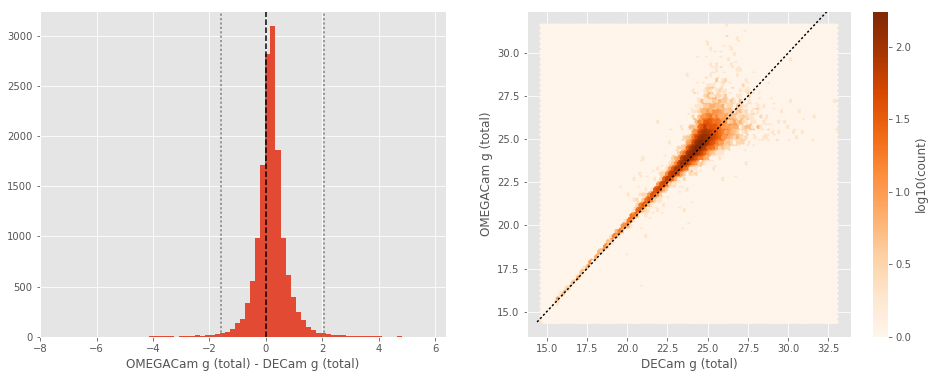

SUPRIME g (aperture) - DECam g (aperture):
- Median: 0.11
- Median Absolute Deviation: 0.30
- 1% percentile: -2.3965823745727537
- 99% percentile: 3.3973081588744893


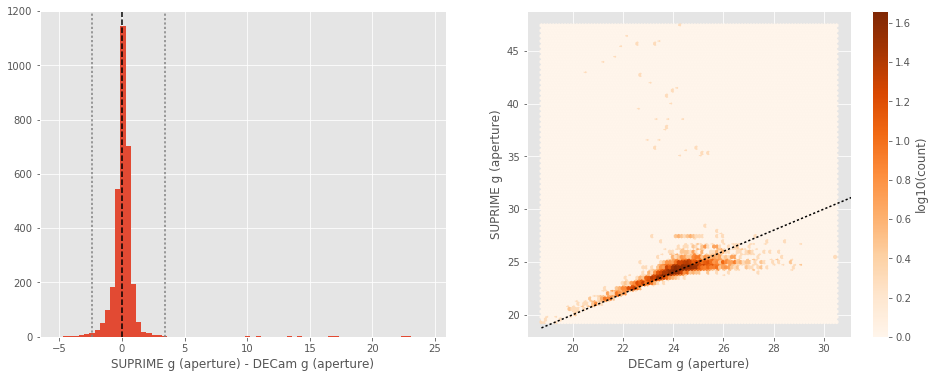

SUPRIME g (total) - DECam g (total):
- Median: -0.22
- Median Absolute Deviation: 0.21
- 1% percentile: -2.2747135543823243
- 99% percentile: 2.554718971252452


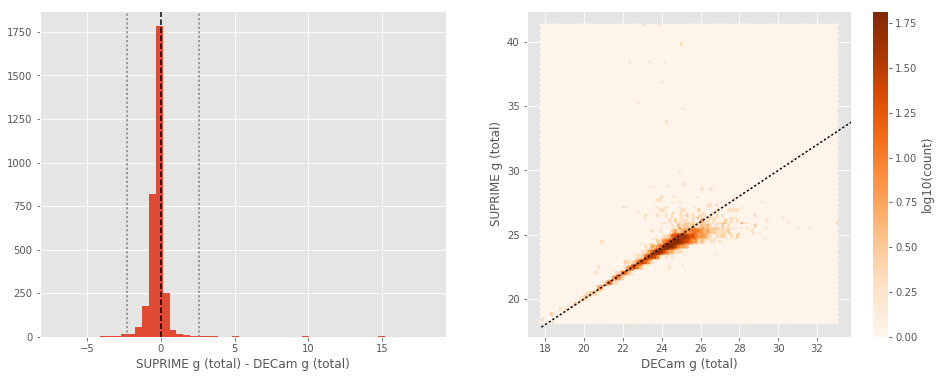

GPC1 g (aperture) - DECam g (aperture):
- Median: -0.06
- Median Absolute Deviation: 0.29
- 1% percentile: -3.3348026275634766
- 99% percentile: 2.6074851989746133


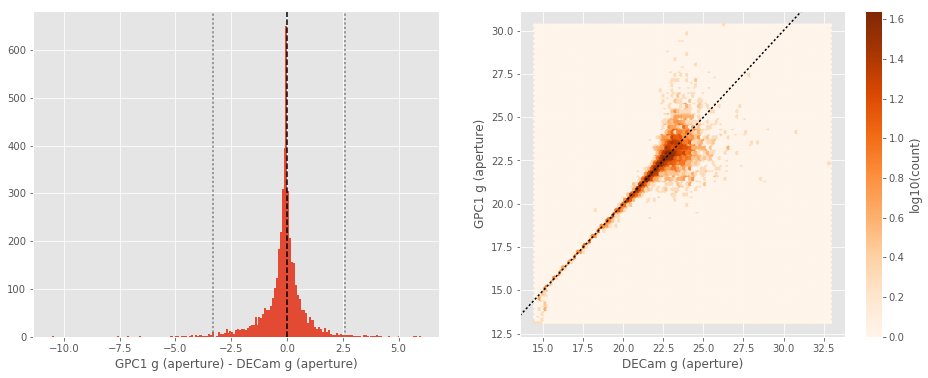

GPC1 g (total) - DECam g (total):
- Median: -0.01
- Median Absolute Deviation: 0.26
- 1% percentile: -3.940695953369141
- 99% percentile: 1.9912368774414095


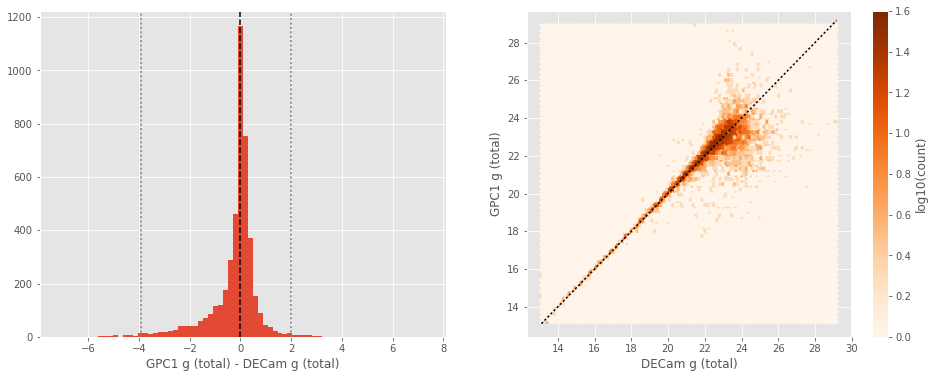

SUPRIME g (aperture) - OMEGACam g (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.21
- 1% percentile: -2.0318746185302734
- 99% percentile: 9.802918243408202


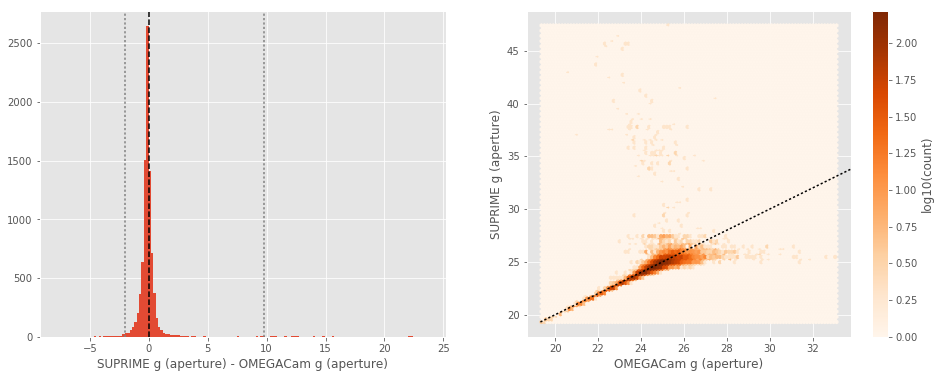

SUPRIME g (total) - OMEGACam g (total):
- Median: -0.45
- Median Absolute Deviation: 0.32
- 1% percentile: -3.178202514648438
- 99% percentile: 3.051005325317375


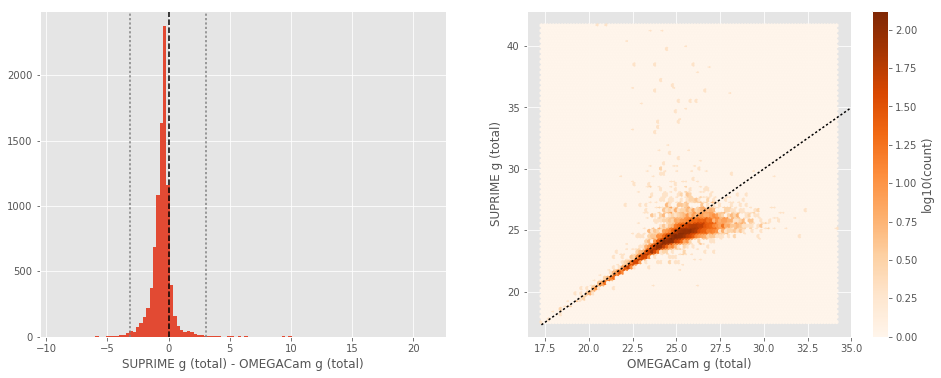

GPC1 g (aperture) - OMEGACam g (aperture):
- Median: -0.39
- Median Absolute Deviation: 0.38
- 1% percentile: -3.1058207702636715
- 99% percentile: 2.433771076202392


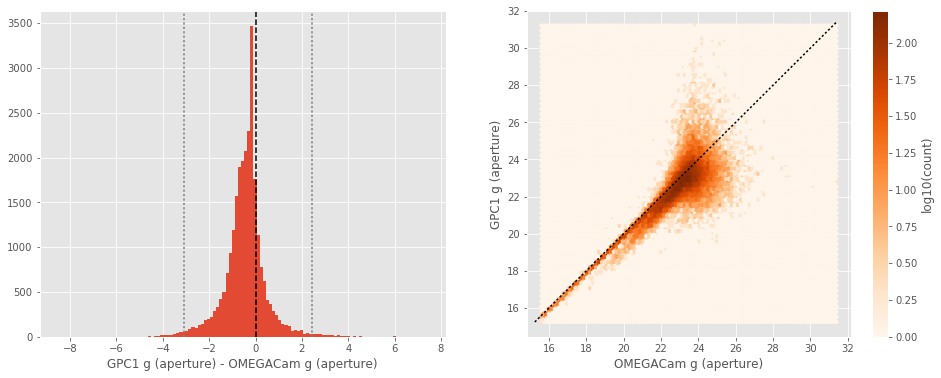

GPC1 g (total) - OMEGACam g (total):
- Median: -0.18
- Median Absolute Deviation: 0.30
- 1% percentile: -3.916410331726074
- 99% percentile: 1.9021331405639639


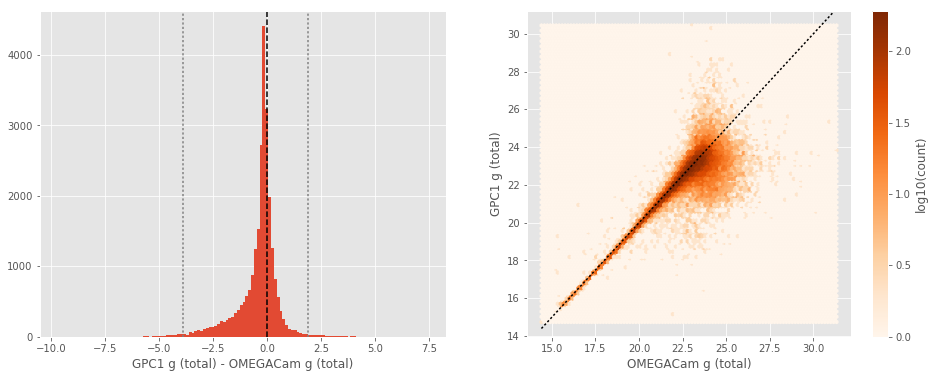

GPC1 g (aperture) - SUPRIME g (aperture):
- Median: -0.29
- Median Absolute Deviation: 0.50
- 1% percentile: -15.363960876464844
- 99% percentile: 2.971078662872315


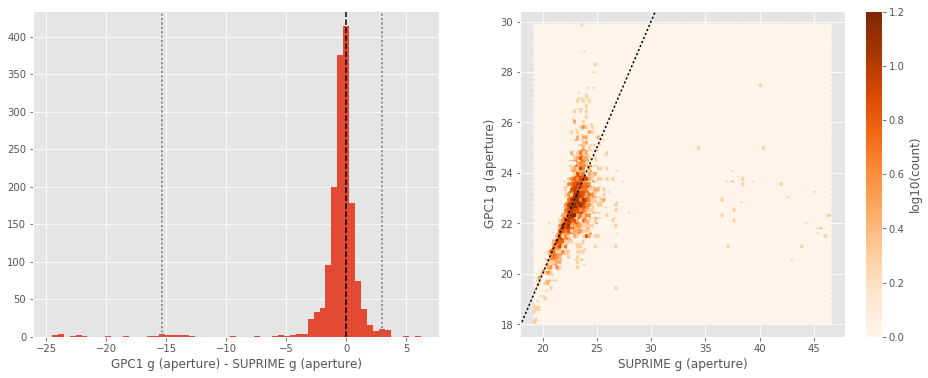

GPC1 g (total) - SUPRIME g (total):
- Median: 0.04
- Median Absolute Deviation: 0.36
- 1% percentile: -6.507472229003906
- 99% percentile: 3.21236476898194


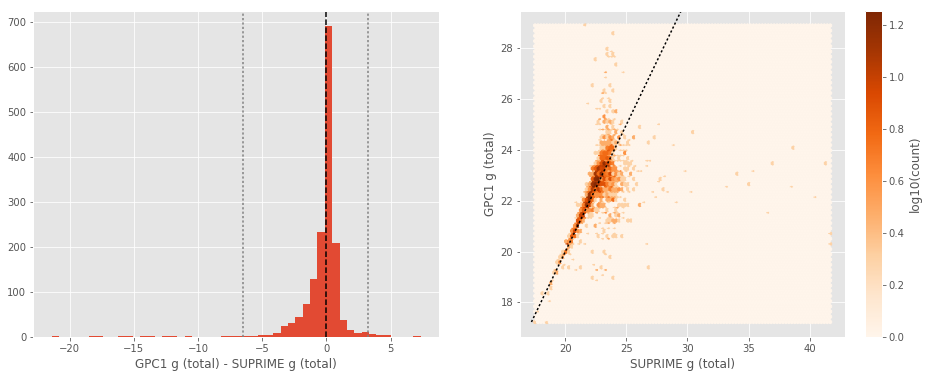

DECam r (aperture) - Megacam r (aperture):
- Median: -0.26
- Median Absolute Deviation: 0.23
- 1% percentile: -1.134426498413086
- 99% percentile: 1.9859558868408211


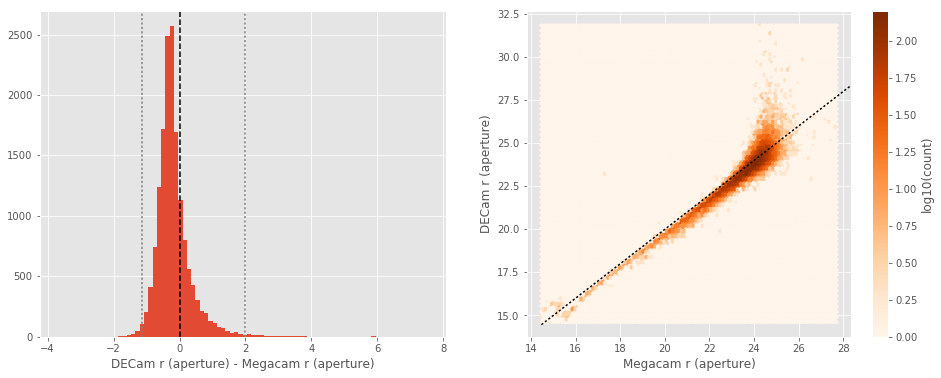

DECam r (total) - Megacam r (total):
- Median: 0.04
- Median Absolute Deviation: 0.18
- 1% percentile: -0.6805744171142578
- 99% percentile: 1.4362227630615216


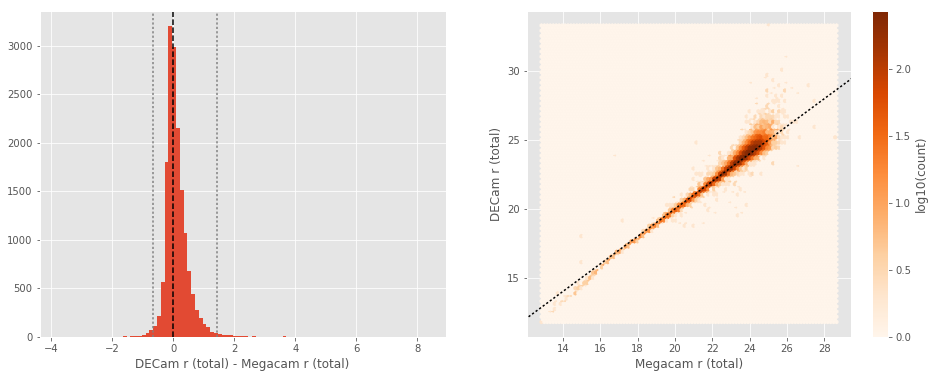

OMEGACam r (aperture) - Megacam r (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.09
- 1% percentile: -0.6767049789428711
- 99% percentile: 0.6531656265258822


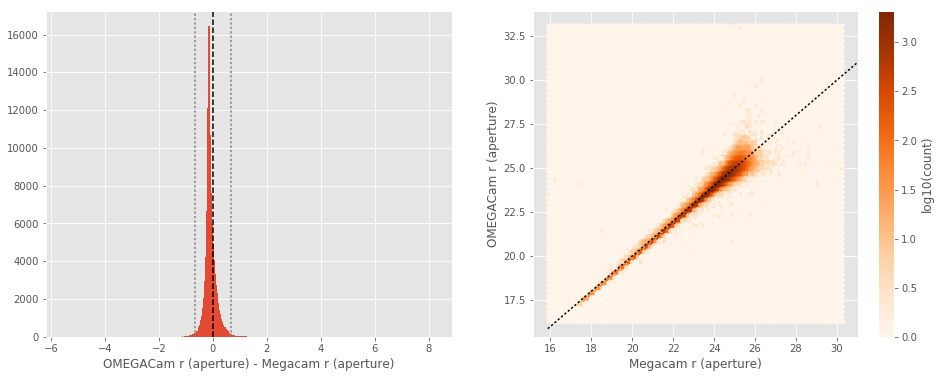

OMEGACam r (total) - Megacam r (total):
- Median: 0.15
- Median Absolute Deviation: 0.15
- 1% percentile: -0.5318502235412598
- 99% percentile: 1.3030487823486319


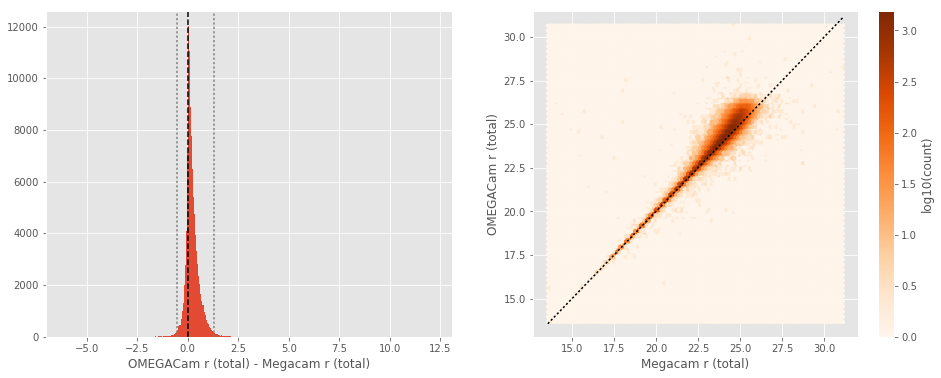

SUPRIME r (aperture) - Megacam r (aperture):
- Median: -0.17
- Median Absolute Deviation: 0.09
- 1% percentile: -1.0723114395141602
- 99% percentile: 4.048919448852554


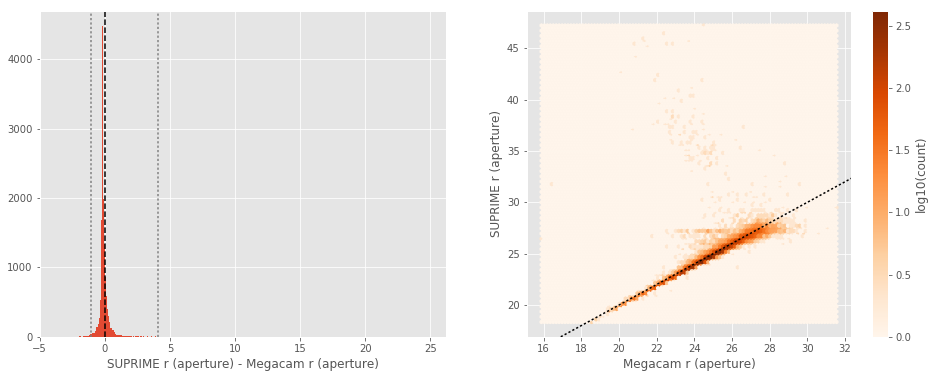

SUPRIME r (total) - Megacam r (total):
- Median: -0.12
- Median Absolute Deviation: 0.14
- 1% percentile: -1.843293685913086
- 99% percentile: 3.28013793945312


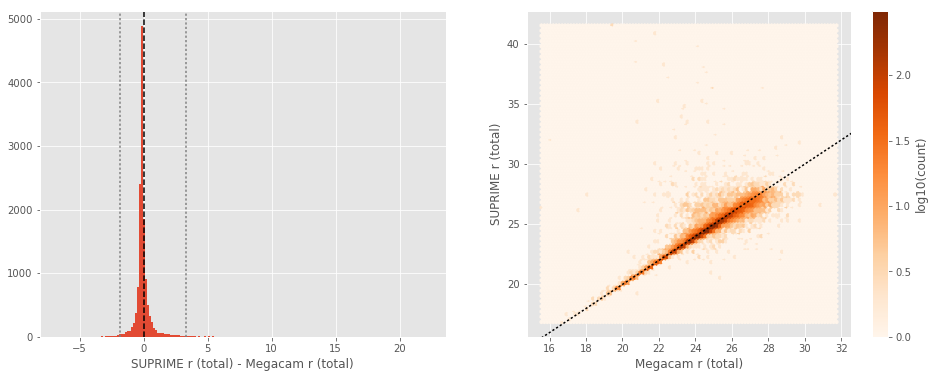

GPC1 r (aperture) - Megacam r (aperture):
- Median: -0.30
- Median Absolute Deviation: 0.26
- 1% percentile: -2.0297008514404298
- 99% percentile: 1.4804008483886724


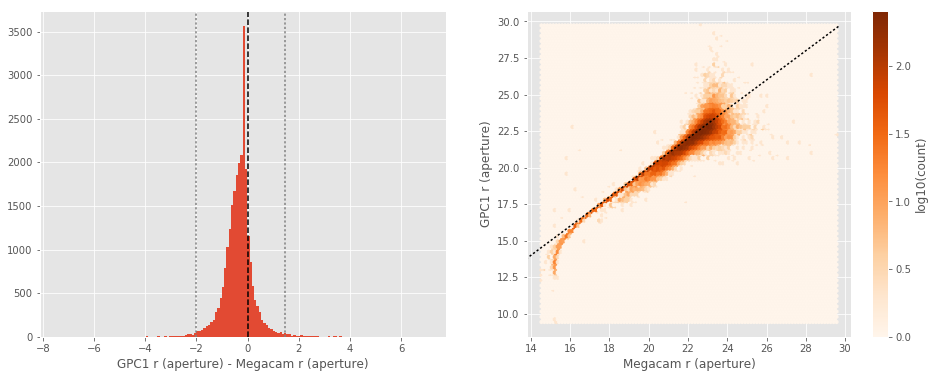

GPC1 r (total) - Megacam r (total):
- Median: 0.09
- Median Absolute Deviation: 0.16
- 1% percentile: -2.2172726440429686
- 99% percentile: 1.3217162322998028


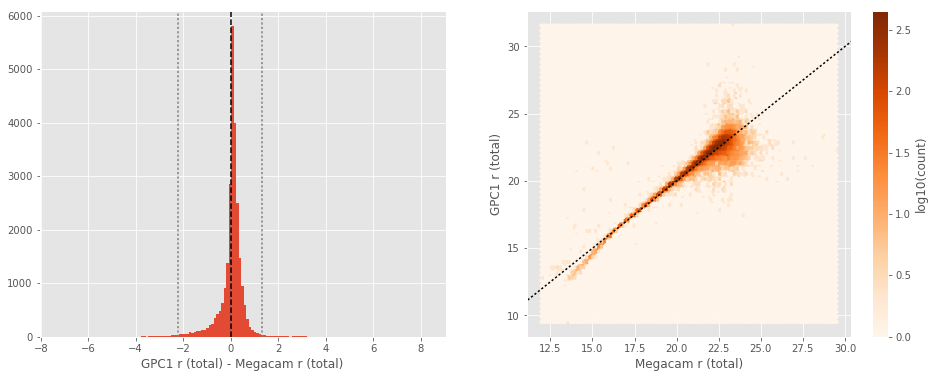

OMEGACam r (aperture) - DECam r (aperture):
- Median: 0.20
- Median Absolute Deviation: 0.24
- 1% percentile: -1.9593385314941405
- 99% percentile: 1.1342347717285155


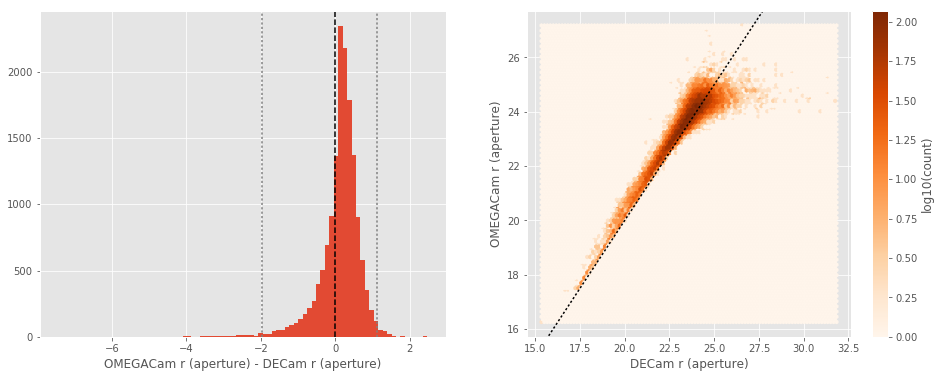

OMEGACam r (total) - DECam r (total):
- Median: 0.11
- Median Absolute Deviation: 0.17
- 1% percentile: -1.0505260467529296
- 99% percentile: 1.1074756622314448


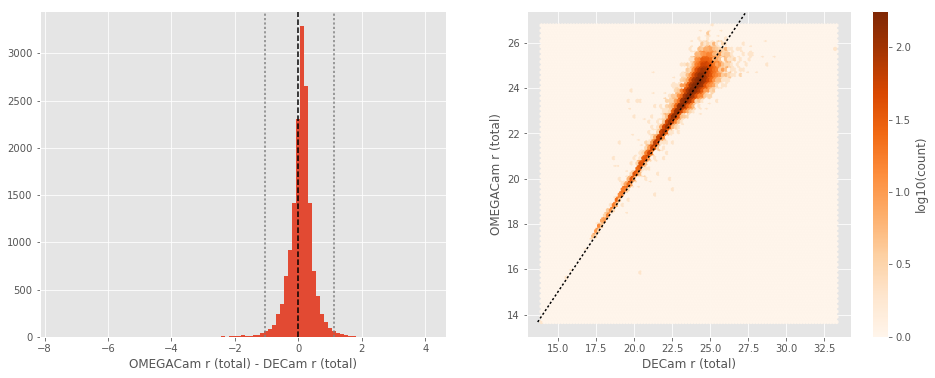

SUPRIME r (aperture) - DECam r (aperture):
- Median: 0.16
- Median Absolute Deviation: 0.26
- 1% percentile: -2.1301557540893556
- 99% percentile: 4.197815704345689


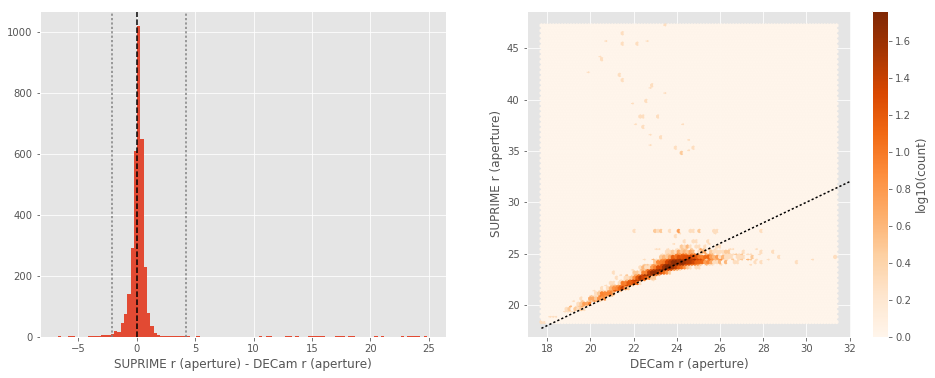

SUPRIME r (total) - DECam r (total):
- Median: -0.13
- Median Absolute Deviation: 0.20
- 1% percentile: -1.5029857635498047
- 99% percentile: 3.052663040161121


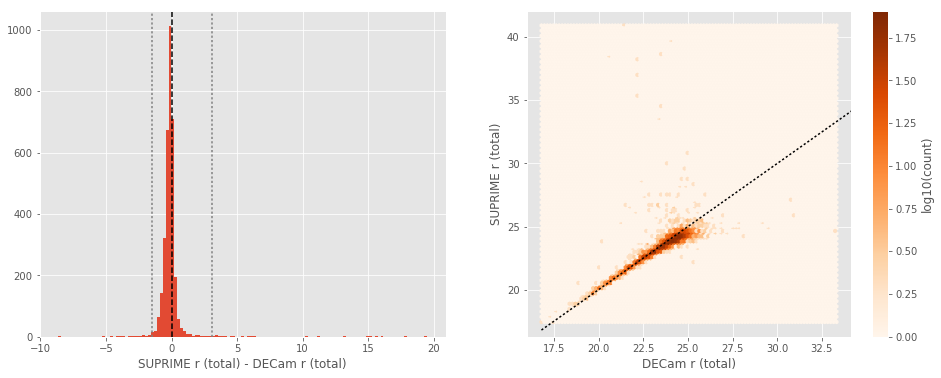

GPC1 r (aperture) - DECam r (aperture):
- Median: 0.11
- Median Absolute Deviation: 0.17
- 1% percentile: -1.9953104782104494
- 99% percentile: 1.8624913787841617


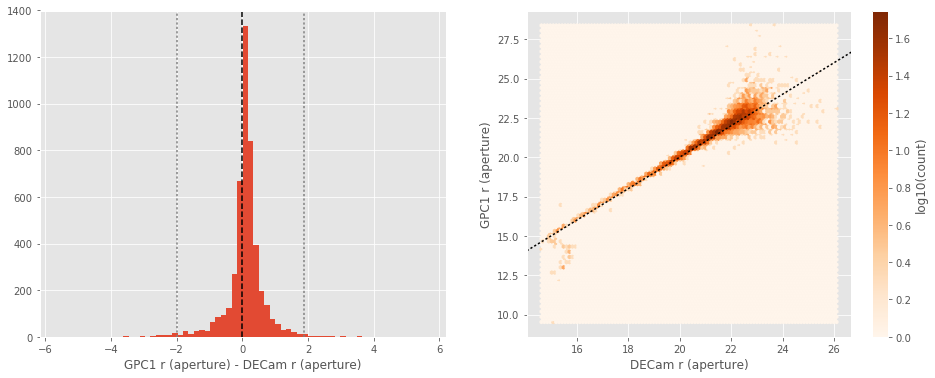

GPC1 r (total) - DECam r (total):
- Median: 0.18
- Median Absolute Deviation: 0.16
- 1% percentile: -2.173877105712891
- 99% percentile: 1.500447006225601


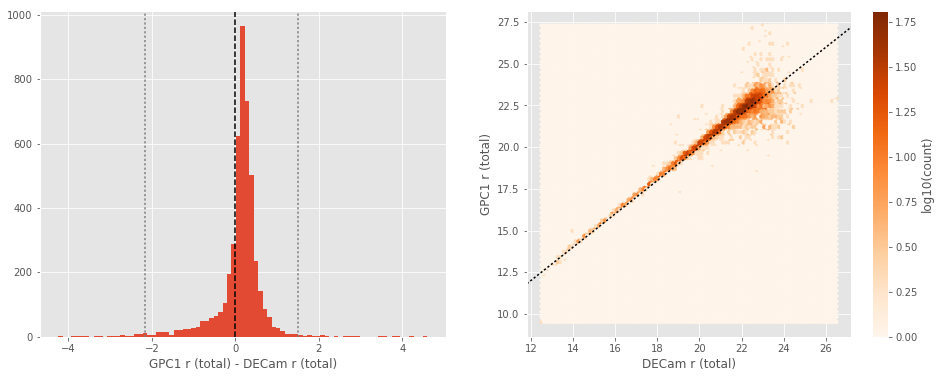

SUPRIME r (aperture) - OMEGACam r (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.12
- 1% percentile: -0.87733154296875
- 99% percentile: 9.925904846191475


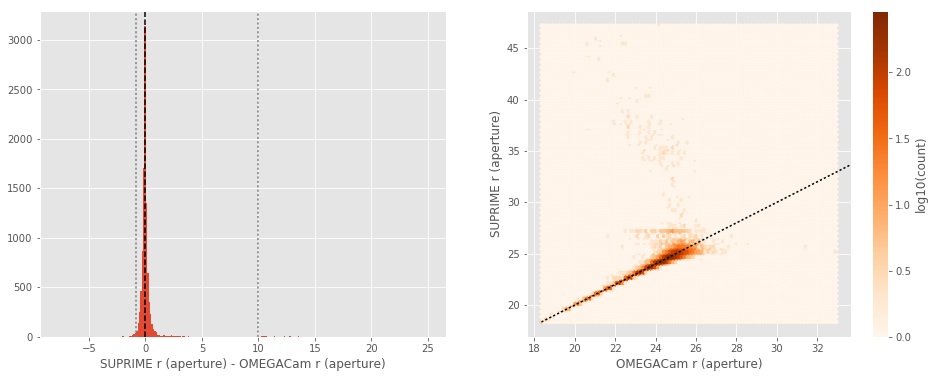

SUPRIME r (total) - OMEGACam r (total):
- Median: -0.25
- Median Absolute Deviation: 0.19
- 1% percentile: -1.4124346733093263
- 99% percentile: 3.6043675994873015


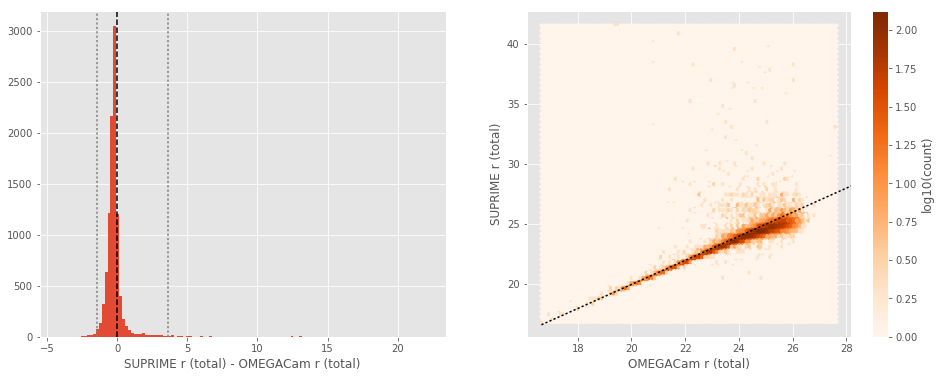

GPC1 r (aperture) - OMEGACam r (aperture):
- Median: -0.15
- Median Absolute Deviation: 0.26
- 1% percentile: -1.7884243774414061
- 99% percentile: 1.6128184318542451


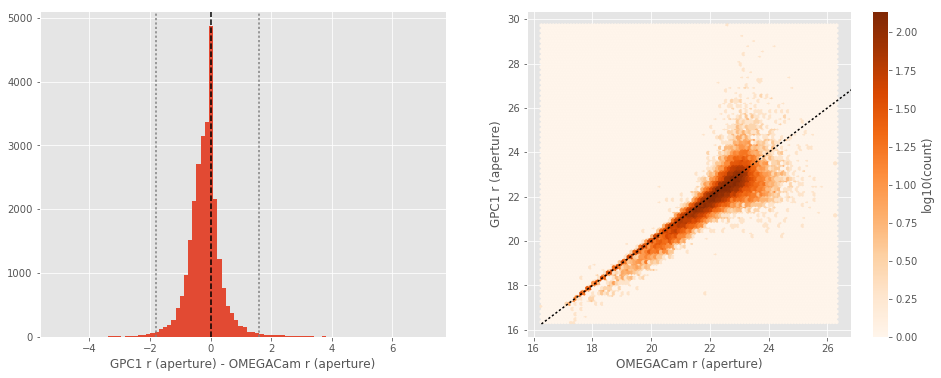

GPC1 r (total) - OMEGACam r (total):
- Median: 0.04
- Median Absolute Deviation: 0.16
- 1% percentile: -2.329339065551758
- 99% percentile: 1.2178982543945354


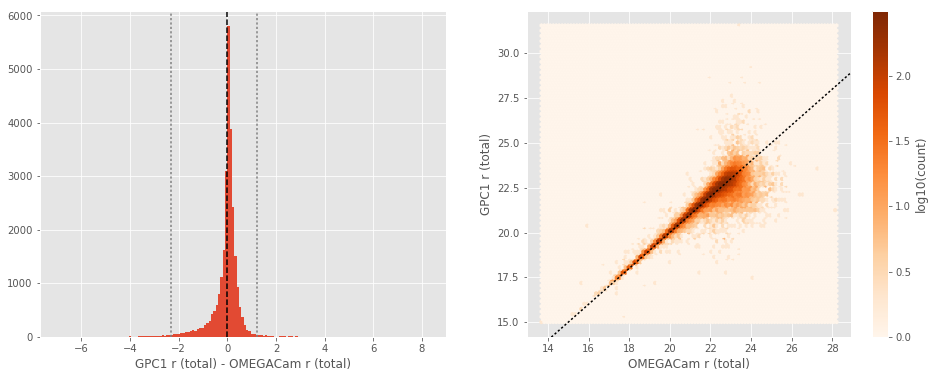

GPC1 r (aperture) - SUPRIME r (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.32
- 1% percentile: -16.055921363830567
- 99% percentile: 1.8339459419250463


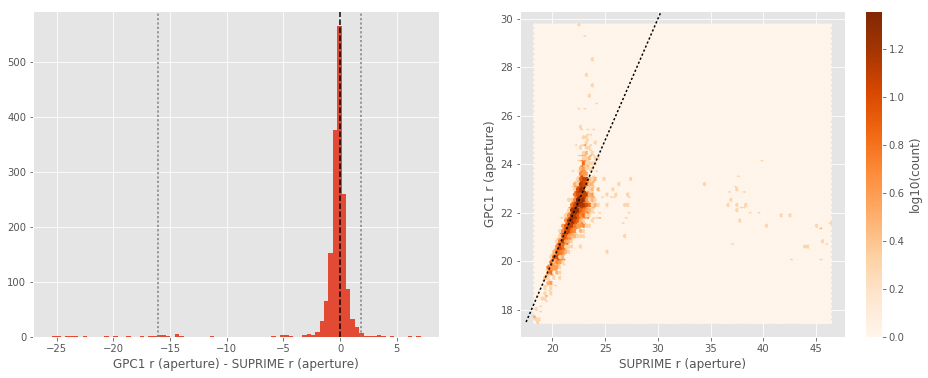

GPC1 r (total) - SUPRIME r (total):
- Median: 0.17
- Median Absolute Deviation: 0.19
- 1% percentile: -5.845101318359374
- 99% percentile: 1.4284396362304674


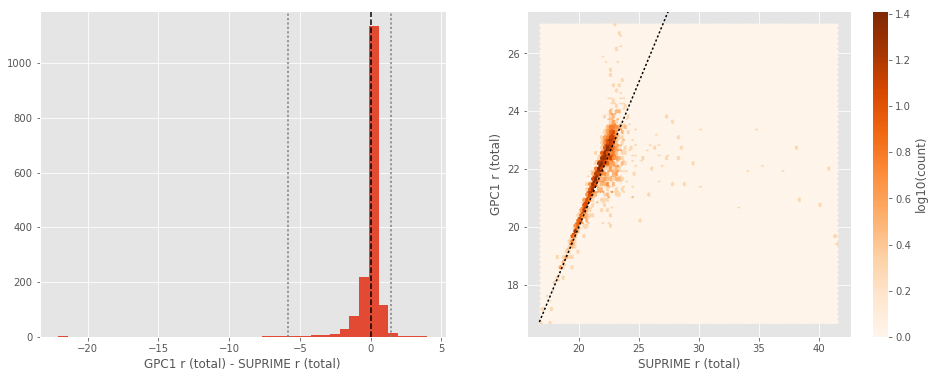

OMEGACam i (aperture) - Megacam i (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1092867851257324
- 99% percentile: 1.992708015441901


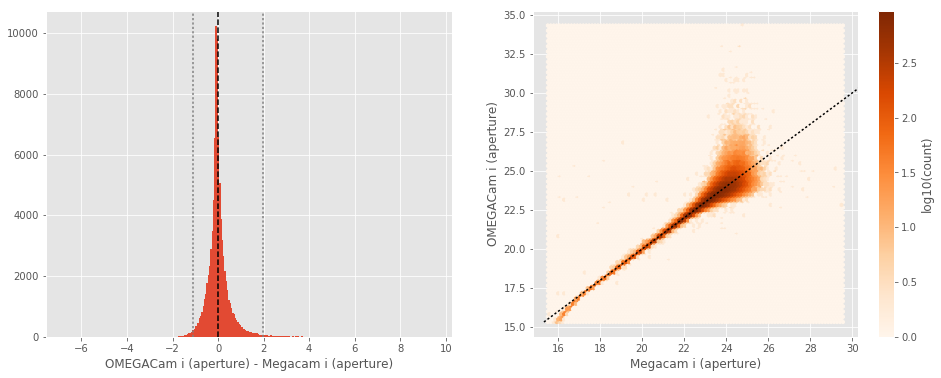

OMEGACam i (total) - Megacam i (total):
- Median: 0.29
- Median Absolute Deviation: 0.27
- 1% percentile: -0.768548355102539
- 99% percentile: 3.1641040039062442


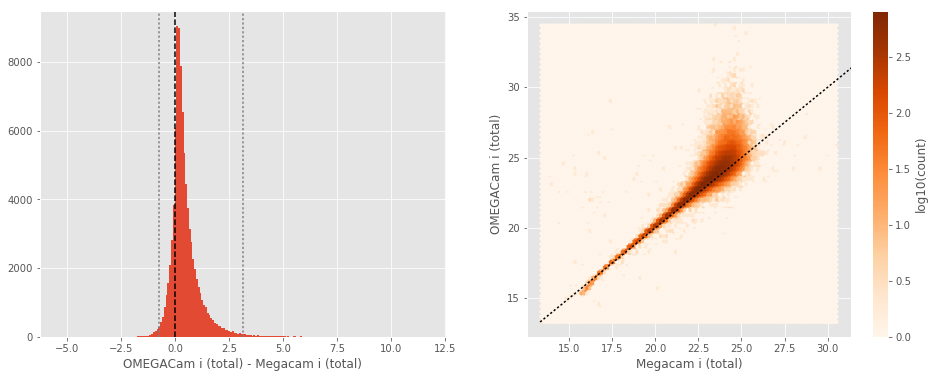

SUPRIME i (aperture) - Megacam i (aperture):
- Median: -0.12
- Median Absolute Deviation: 0.08
- 1% percentile: -1.1673651123046875
- 99% percentile: 1.3102802658081


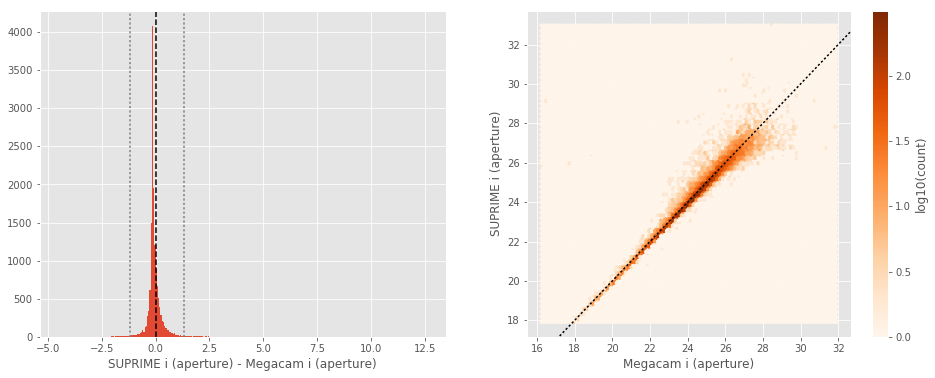

SUPRIME i (total) - Megacam i (total):
- Median: -0.05
- Median Absolute Deviation: 0.14
- 1% percentile: -1.7760374832153318
- 99% percentile: 1.8637299728393568


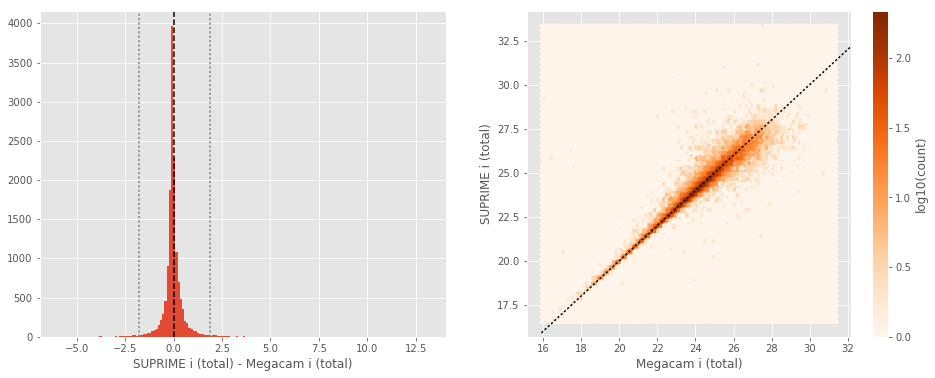

GPC1 i (aperture) - Megacam i (aperture):
- Median: -0.22
- Median Absolute Deviation: 0.21
- 1% percentile: -1.614451675415039
- 99% percentile: 1.1814591217040995


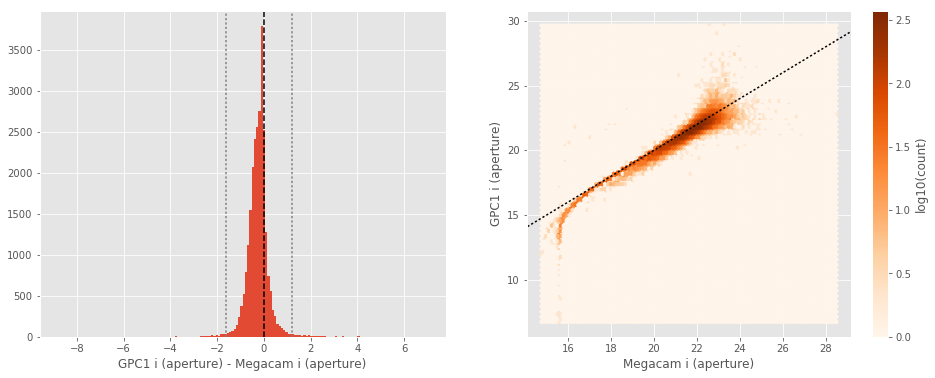

GPC1 i (total) - Megacam i (total):
- Median: 0.17
- Median Absolute Deviation: 0.12
- 1% percentile: -1.186130199432373
- 99% percentile: 1.0592702865600525


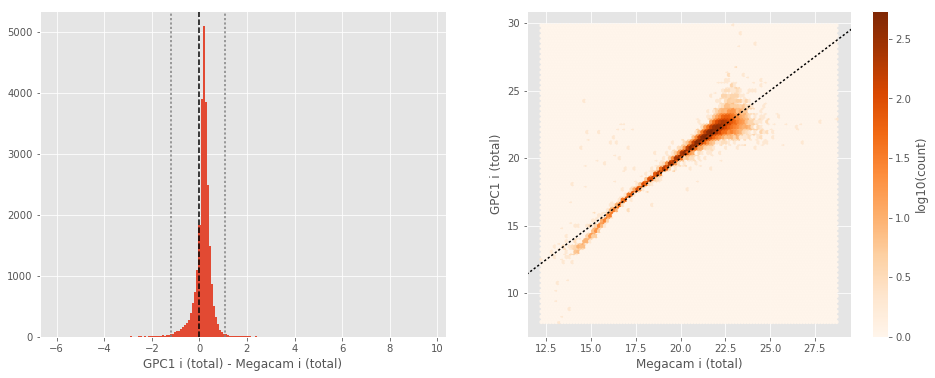

SUPRIME i (aperture) - OMEGACam i (aperture):
- Median: -0.05
- Median Absolute Deviation: 0.24
- 1% percentile: -2.3042778015136722
- 99% percentile: 1.422661437988281


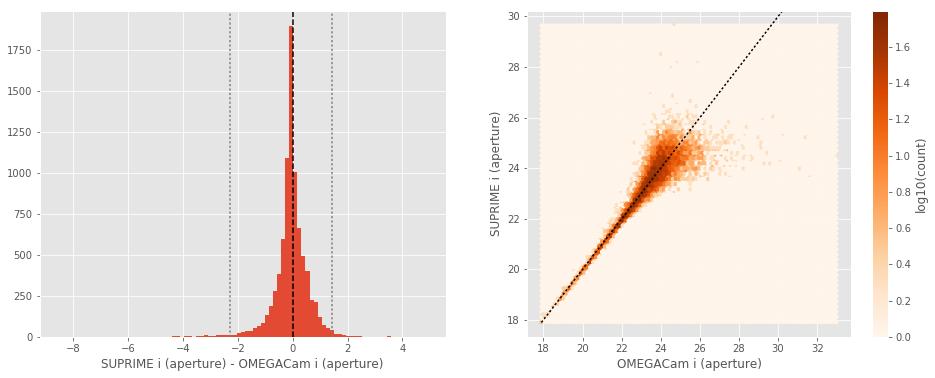

SUPRIME i (total) - OMEGACam i (total):
- Median: -0.32
- Median Absolute Deviation: 0.32
- 1% percentile: -3.488183822631836
- 99% percentile: 1.282999496459955


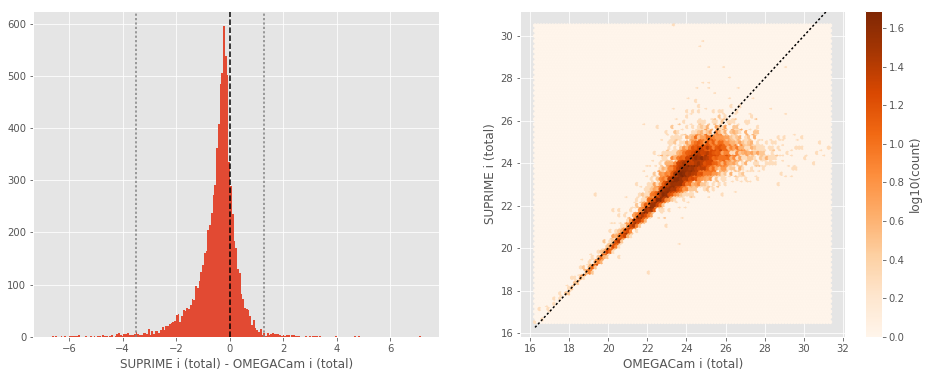

GPC1 i (aperture) - OMEGACam i (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.21
- 1% percentile: -1.3538485336303712
- 99% percentile: 1.1777175521850587


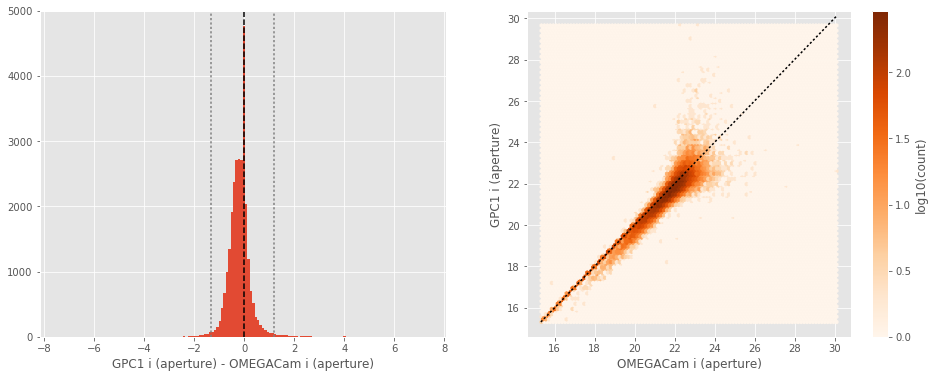

GPC1 i (total) - OMEGACam i (total):
- Median: 0.01
- Median Absolute Deviation: 0.14
- 1% percentile: -1.6437100791931154
- 99% percentile: 0.8998844146728499


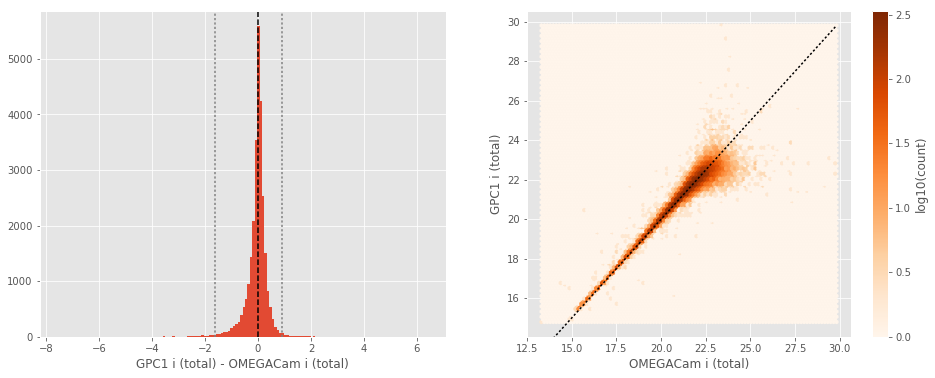

GPC1 i (aperture) - SUPRIME i (aperture):
- Median: -0.14
- Median Absolute Deviation: 0.22
- 1% percentile: -1.4911978912353514
- 99% percentile: 0.828904418945309


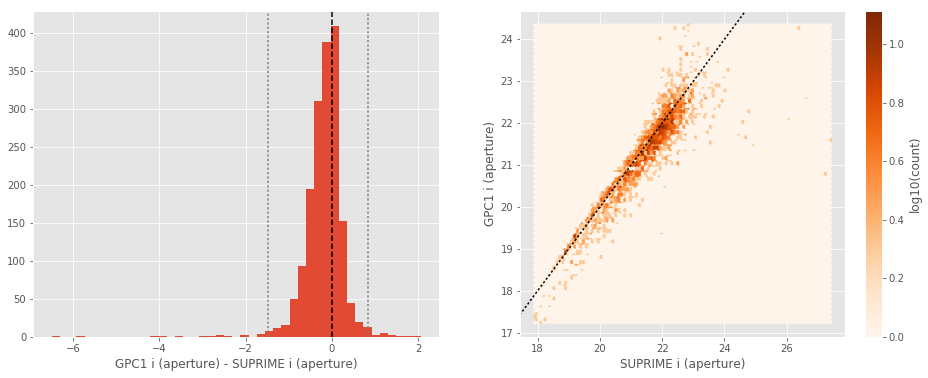

GPC1 i (total) - SUPRIME i (total):
- Median: 0.19
- Median Absolute Deviation: 0.13
- 1% percentile: -1.1409231185913087
- 99% percentile: 0.8934357070922851


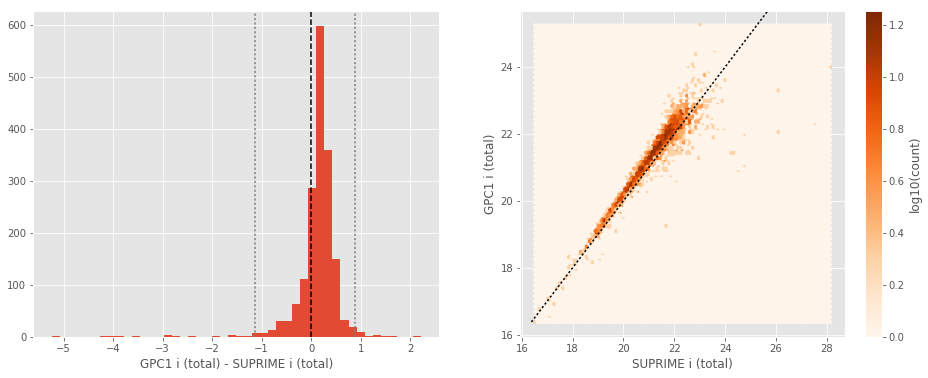

No sources have both Megacam z (aperture) and DECam z (aperture) values.
DECam z (total) - Megacam z (total):
- Median: -0.02
- Median Absolute Deviation: 0.15
- 1% percentile: -0.8053544616699219
- 99% percentile: 1.3914360427856445


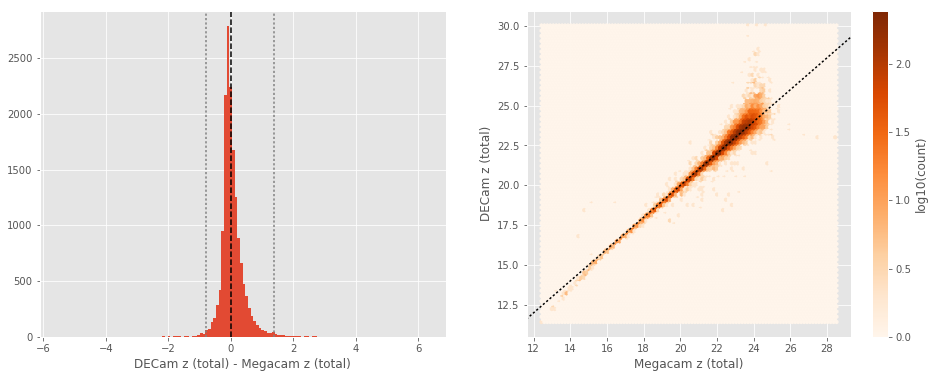

SUPRIME z (aperture) - Megacam z (aperture):
- Median: -0.17
- Median Absolute Deviation: 0.10
- 1% percentile: -1.6213567161560056
- 99% percentile: 1.4344389343261703


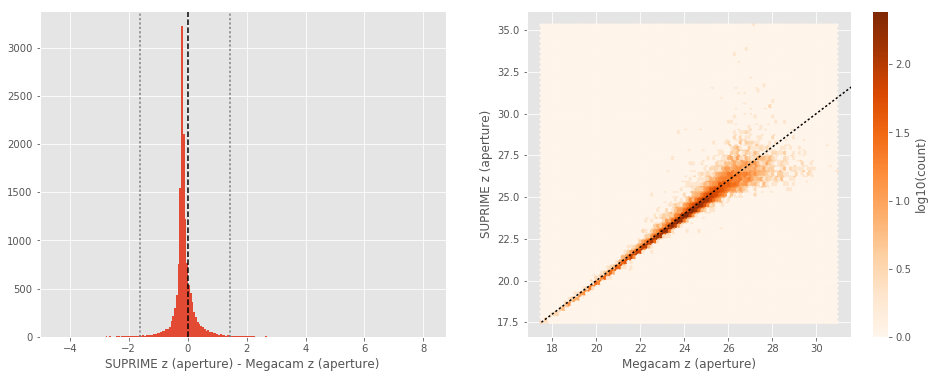

SUPRIME z (total) - Megacam z (total):
- Median: -0.11
- Median Absolute Deviation: 0.15
- 1% percentile: -2.065248146057129
- 99% percentile: 1.7901291275024391


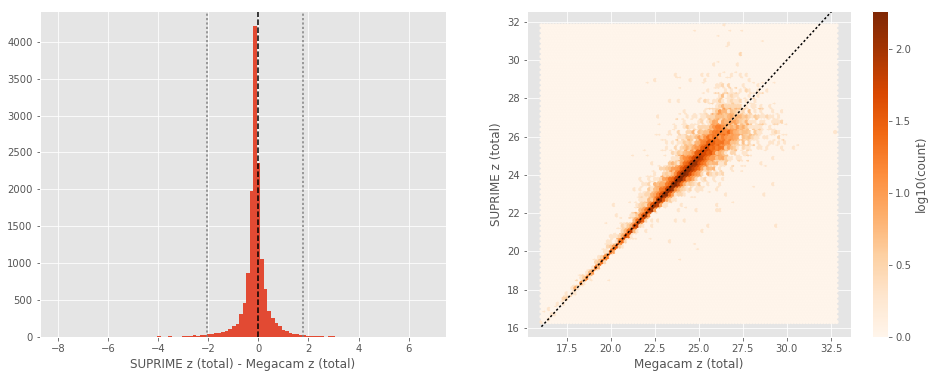

GPC1 z (aperture) - Megacam z (aperture):
- Median: -0.27
- Median Absolute Deviation: 0.23
- 1% percentile: -1.7483997344970703
- 99% percentile: 1.5160202026367229


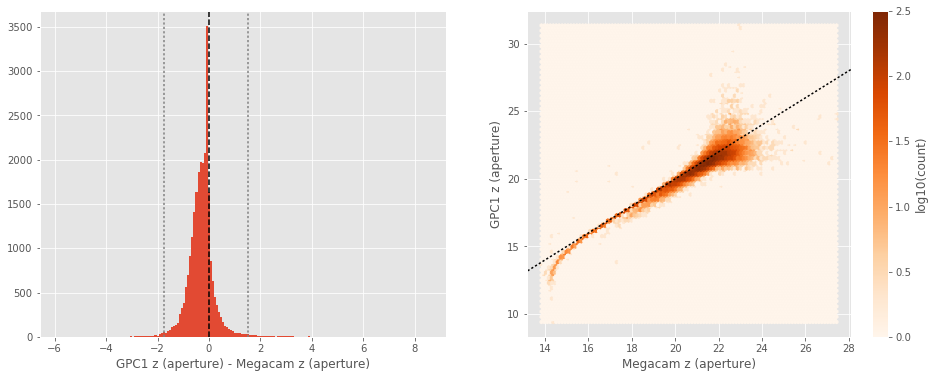

GPC1 z (total) - Megacam z (total):
- Median: 0.14
- Median Absolute Deviation: 0.15
- 1% percentile: -1.6717203521728514
- 99% percentile: 1.385521183013916


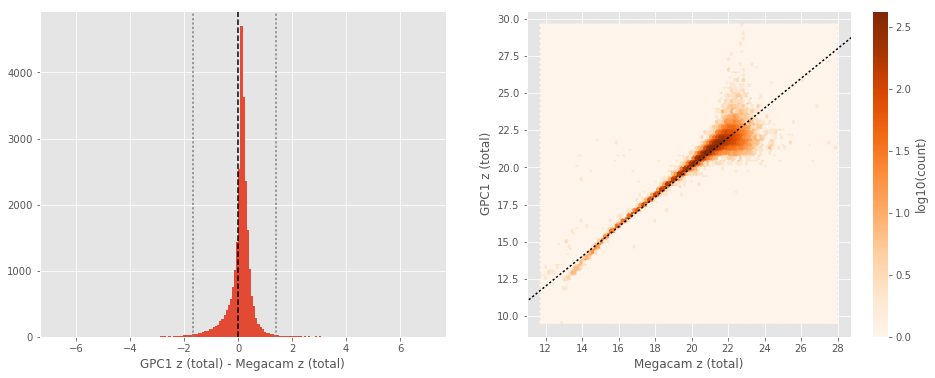

No sources have both DECam z (aperture) and SUPRIME z (aperture) values.
SUPRIME z (total) - DECam z (total):
- Median: -0.09
- Median Absolute Deviation: 0.17
- 1% percentile: -1.4573444175720216
- 99% percentile: 1.1159436416625999


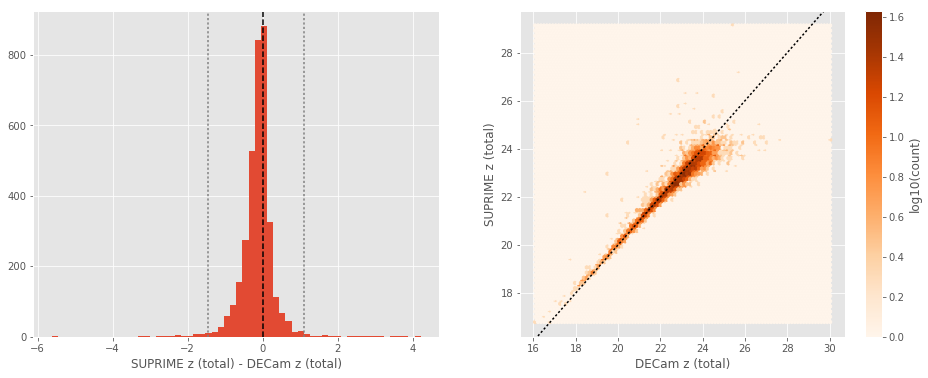

No sources have both DECam z (aperture) and GPC1 z (aperture) values.
GPC1 z (total) - DECam z (total):
- Median: 0.24
- Median Absolute Deviation: 0.14
- 1% percentile: -1.5070764732360842
- 99% percentile: 1.2869865989685059


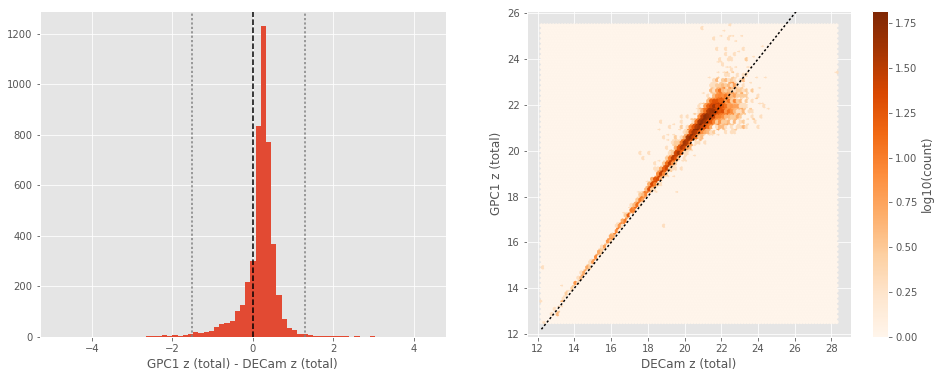

GPC1 z (aperture) - SUPRIME z (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.26
- 1% percentile: -1.572754669189453
- 99% percentile: 1.6010896301269524


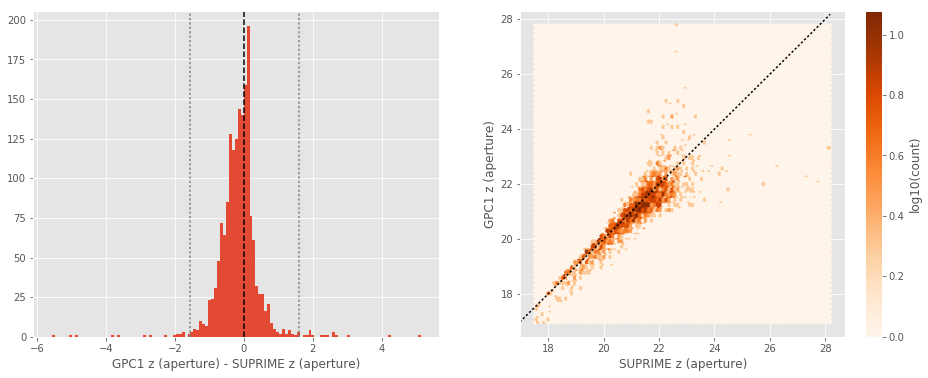

GPC1 z (total) - SUPRIME z (total):
- Median: 0.20
- Median Absolute Deviation: 0.16
- 1% percentile: -1.6052886199951173
- 99% percentile: 1.360244503021241


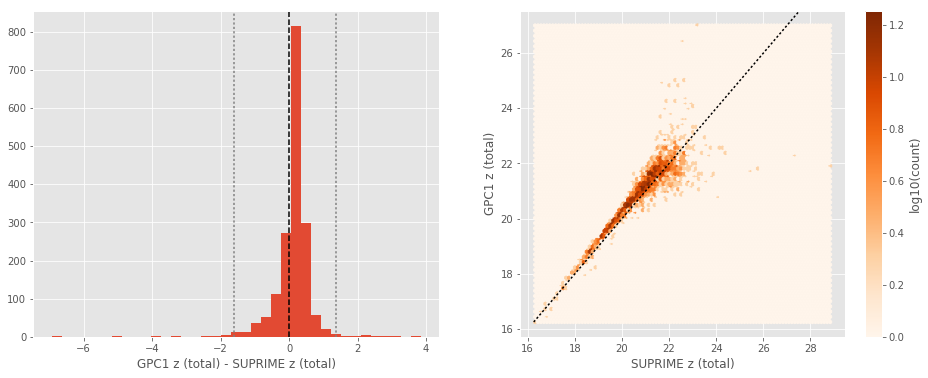

GPC1 y (aperture) - SUPRIME y (aperture):
- Median: -0.50
- Median Absolute Deviation: 0.38
- 1% percentile: -2.9172115325927734
- 99% percentile: 1.679821491241455


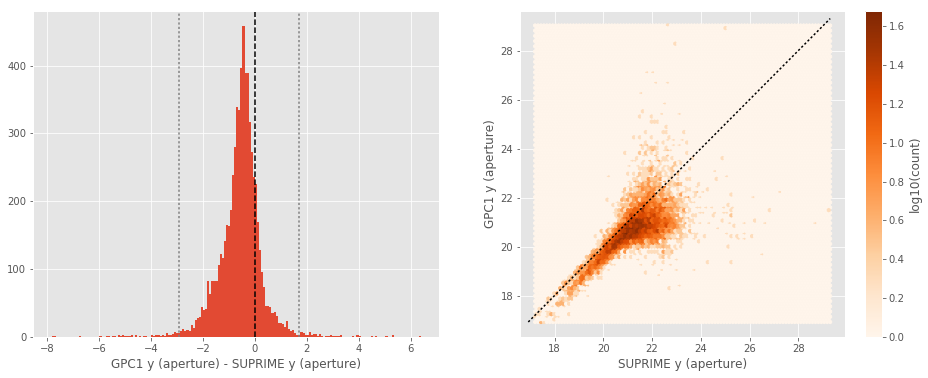

GPC1 y (total) - SUPRIME y (total):
- Median: 0.08
- Median Absolute Deviation: 0.42
- 1% percentile: -2.9614925003051757
- 99% percentile: 2.372653484344483


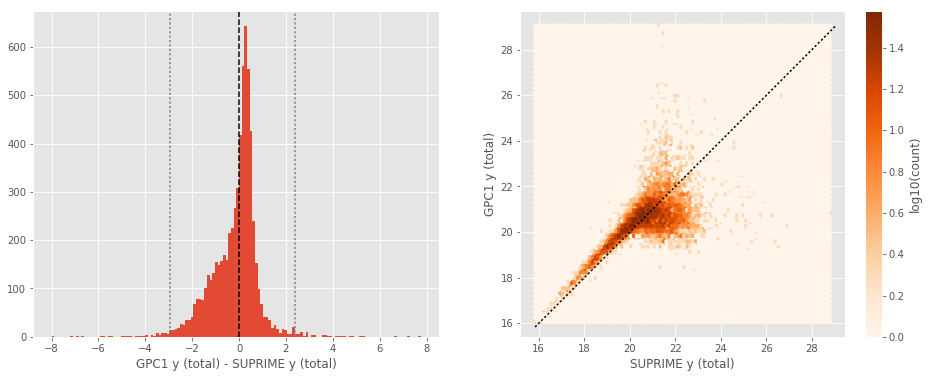

UKIDSS Y (aperture) - SUPRIME y (aperture):
- Median: 0.06
- Median Absolute Deviation: 0.16
- 1% percentile: -0.4685753631591797
- 99% percentile: 1.0019708251953123


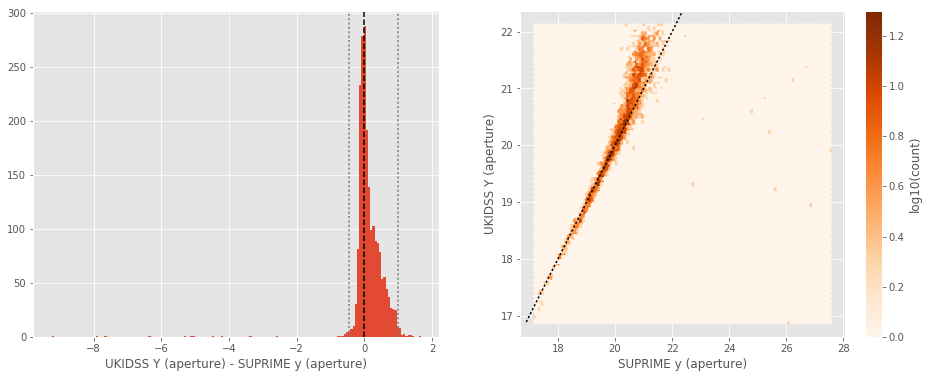

UKIDSS Y (total) - SUPRIME y (total):
- Median: 0.17
- Median Absolute Deviation: 0.19
- 1% percentile: -0.9000317764282226
- 99% percentile: 1.0222741889953595


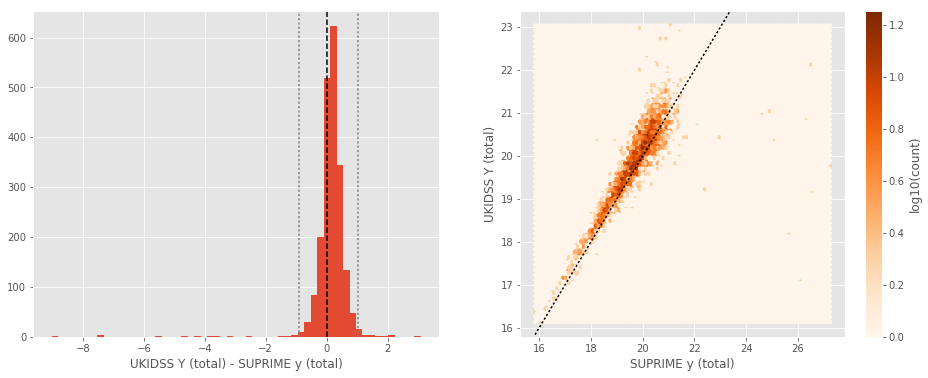

UKIDSS Y (aperture) - GPC1 y (aperture):
- Median: 0.15
- Median Absolute Deviation: 0.22
- 1% percentile: -0.9620066261291504
- 99% percentile: 1.5604861831665056


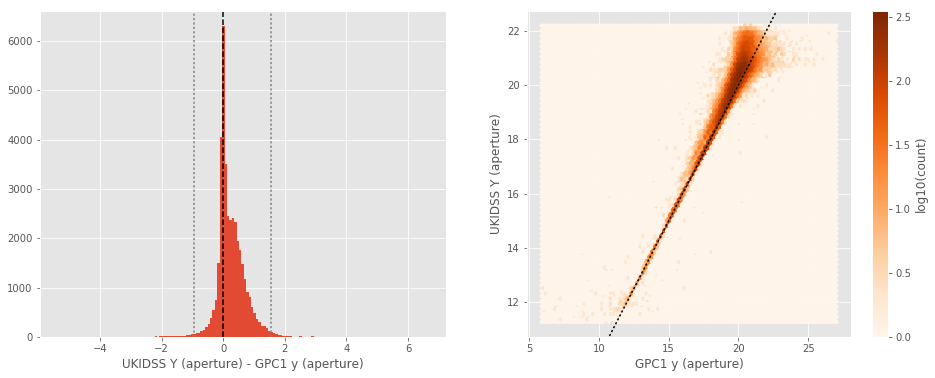

UKIDSS Y (total) - GPC1 y (total):
- Median: -0.09
- Median Absolute Deviation: 0.15
- 1% percentile: -1.15895809173584
- 99% percentile: 1.381700782775879


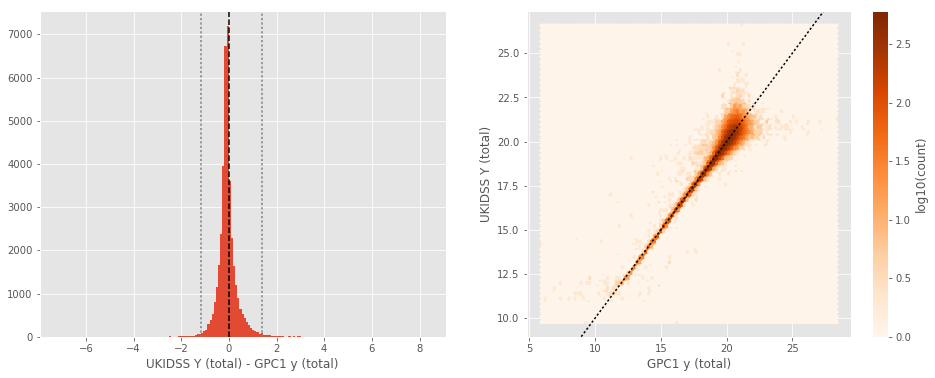

WIRCam J (aperture) - VISTA J (aperture):
- Median: 0.10
- Median Absolute Deviation: 0.16
- 1% percentile: -1.1224720001220703
- 99% percentile: 2.3709549903869713


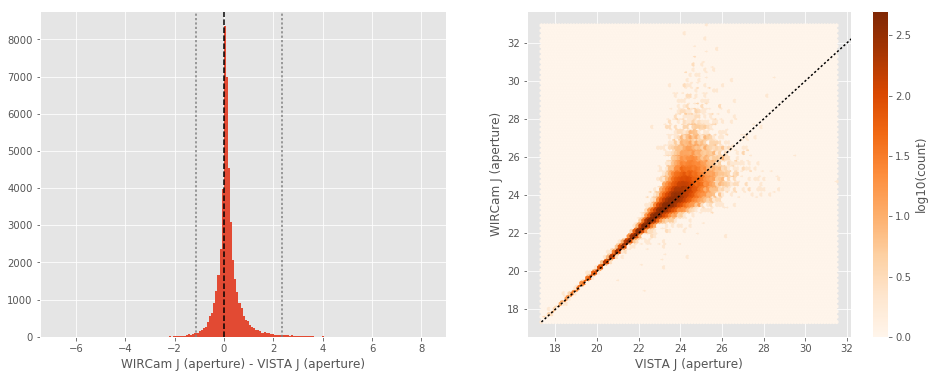

WIRCam J (total) - VISTA J (total):
- Median: 0.17
- Median Absolute Deviation: 0.23
- 1% percentile: -1.3518555450439453
- 99% percentile: 2.8442310333251855


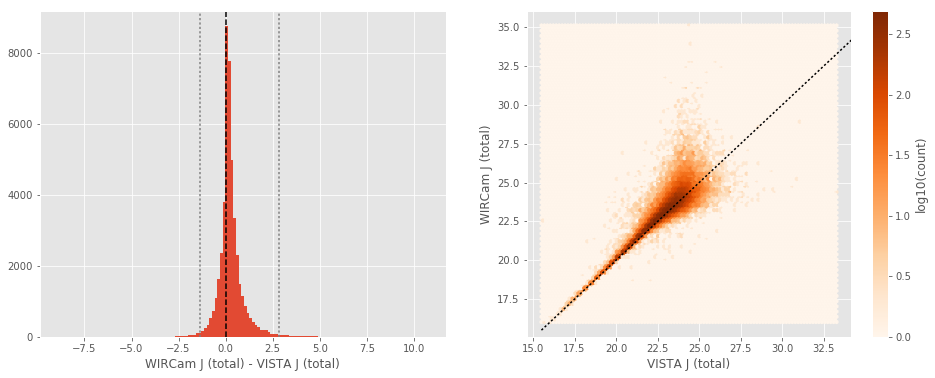

UKIDSS J (aperture) - VISTA J (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.07
- 1% percentile: -0.5138017463684081
- 99% percentile: 0.3151991271972655


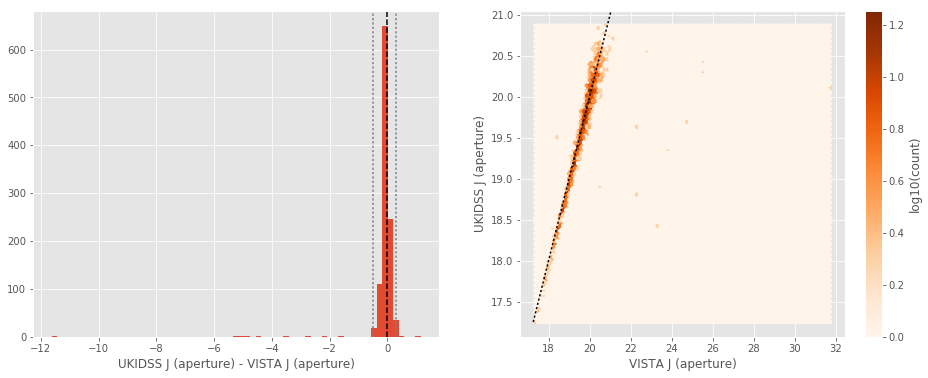

UKIDSS J (total) - VISTA J (total):
- Median: 0.34
- Median Absolute Deviation: 0.15
- 1% percentile: -0.3445081329345703
- 99% percentile: 1.138738784790039


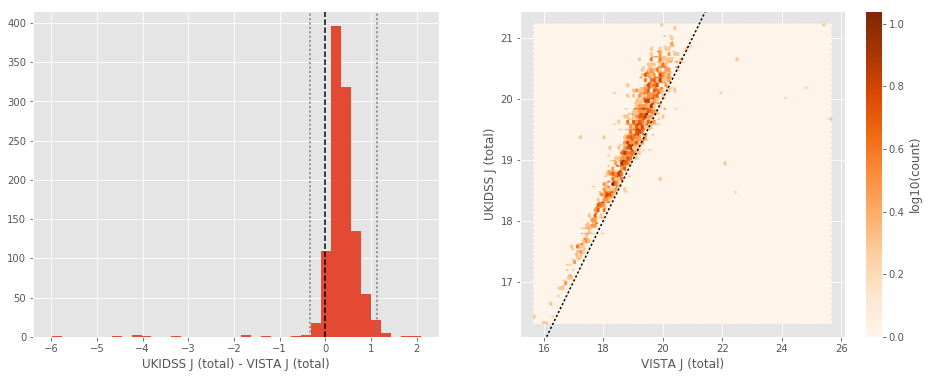

UKIDSS J (aperture) - WIRCam J (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.06
- 1% percentile: -1.1706670761108398
- 99% percentile: 0.3103367233276365


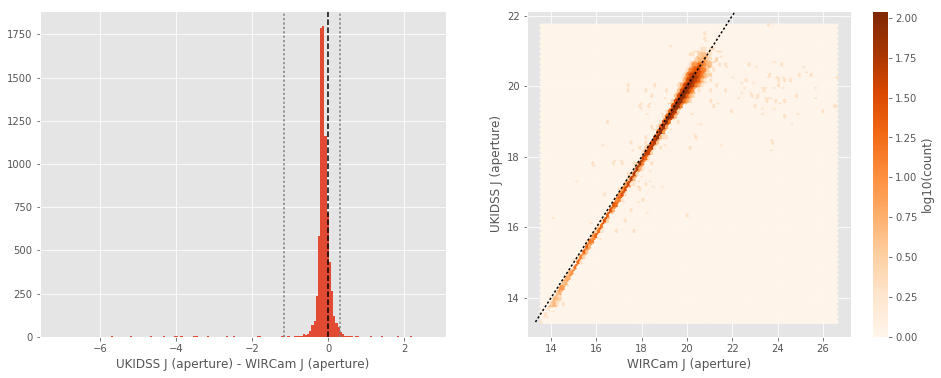

UKIDSS J (total) - WIRCam J (total):
- Median: 0.17
- Median Absolute Deviation: 0.11
- 1% percentile: -0.8104349517822267
- 99% percentile: 1.035262451171873


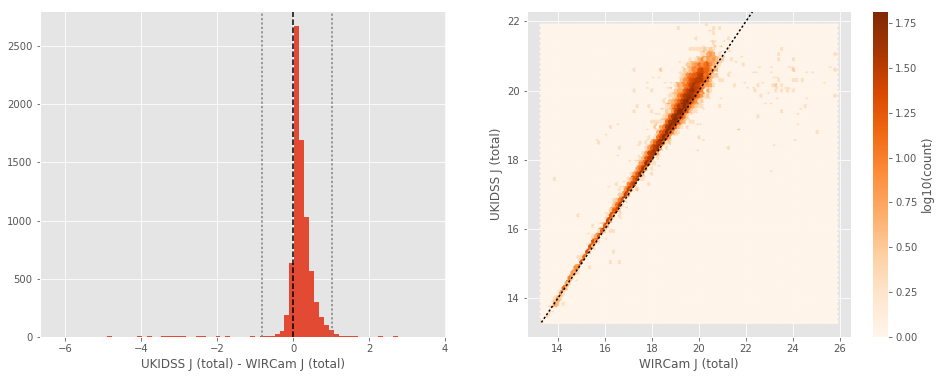

WIRCam H (aperture) - VISTA H (aperture):
- Median: 0.05
- Median Absolute Deviation: 0.27
- 1% percentile: -2.343078155517578
- 99% percentile: 3.0881636047363177


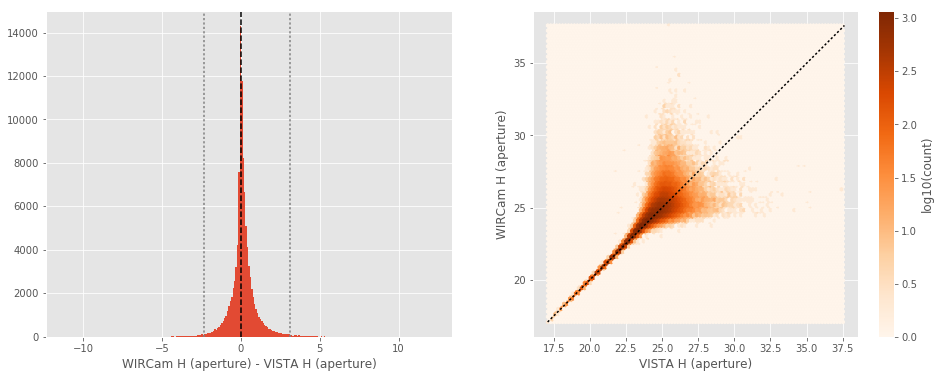

WIRCam H (total) - VISTA H (total):
- Median: 0.01
- Median Absolute Deviation: 0.32
- 1% percentile: -2.6515286254882815
- 99% percentile: 3.235139217376709


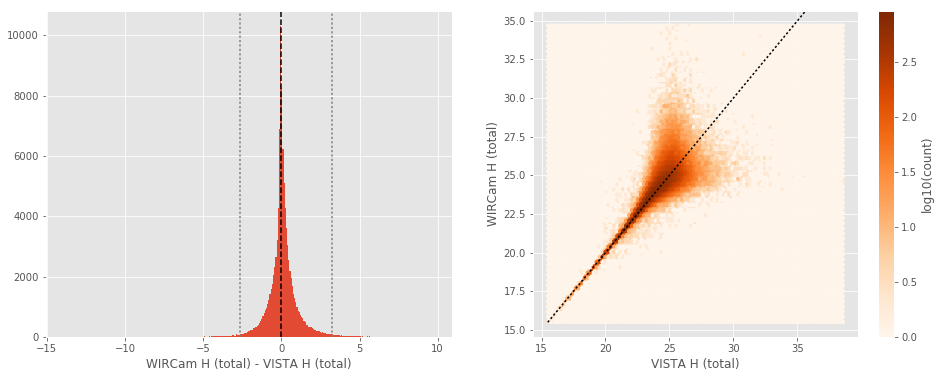

UKIDSS H (aperture) - VISTA H (aperture):
- Median: -0.16
- Median Absolute Deviation: 0.08
- 1% percentile: -0.7218075752258301
- 99% percentile: 0.20712022781372075


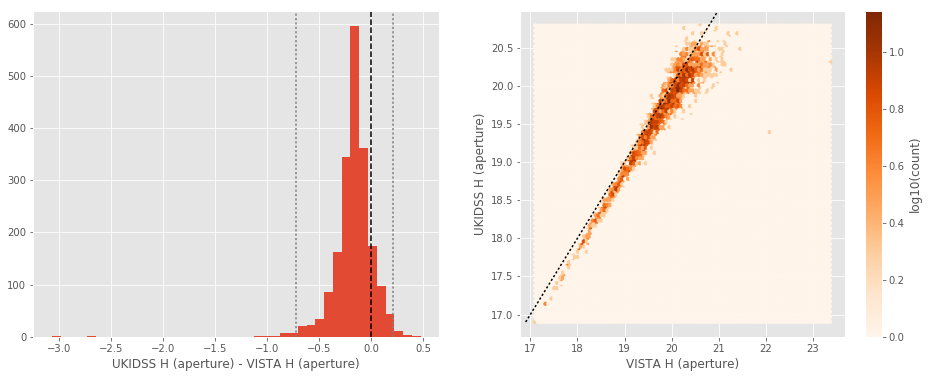

UKIDSS H (total) - VISTA H (total):
- Median: 0.13
- Median Absolute Deviation: 0.17
- 1% percentile: -0.8132301330566405
- 99% percentile: 1.2011348724365236


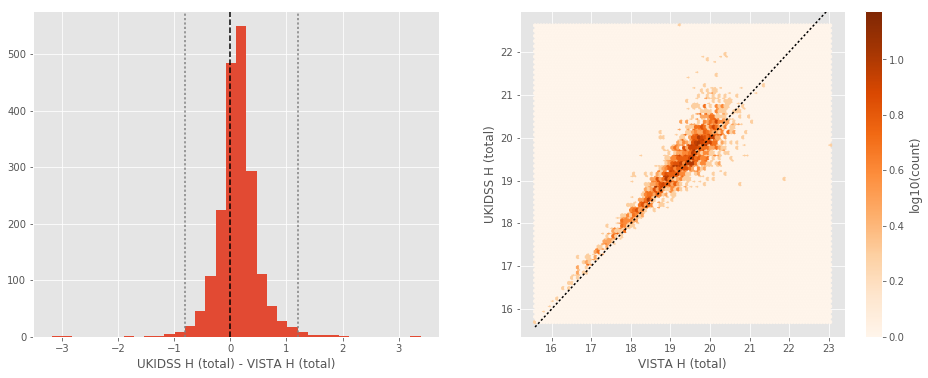

UKIDSS H (aperture) - WIRCam H (aperture):
- Median: -0.08
- Median Absolute Deviation: 0.07
- 1% percentile: -0.6562310791015624
- 99% percentile: 0.28938720703124937


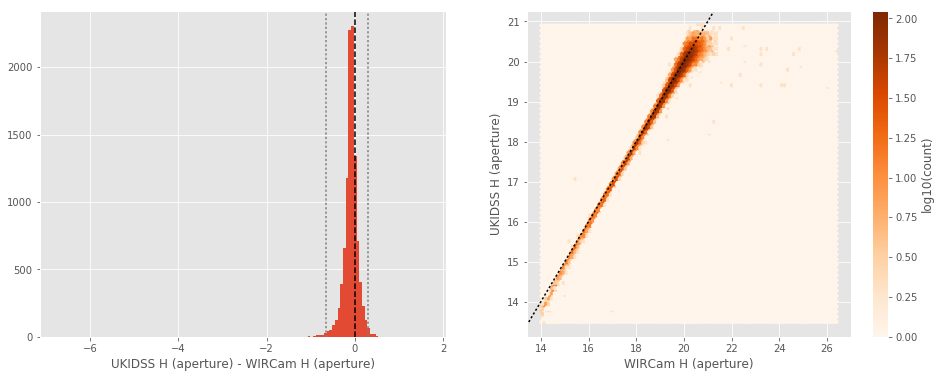

UKIDSS H (total) - WIRCam H (total):
- Median: 0.14
- Median Absolute Deviation: 0.13
- 1% percentile: -0.838961696624756
- 99% percentile: 1.231600437164306


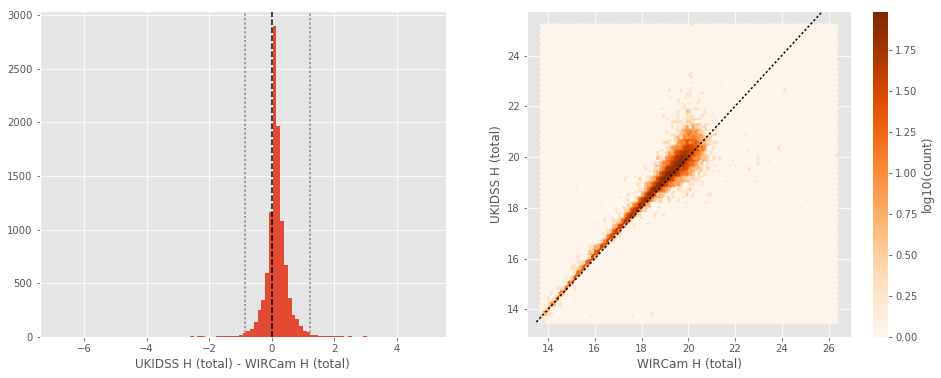

WIRCam Ks (aperture) - VISTA Ks (aperture):
- Median: -0.03
- Median Absolute Deviation: 0.25
- 1% percentile: -2.55767707824707
- 99% percentile: 2.8314308166503905


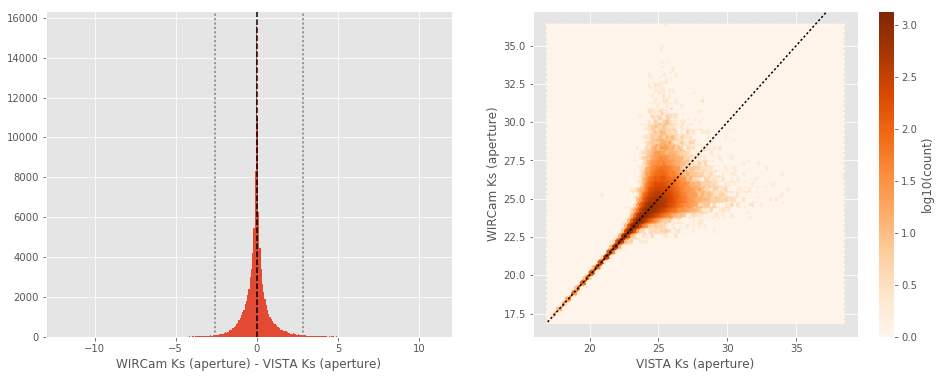

WIRCam Ks (total) - VISTA Ks (total):
- Median: -0.07
- Median Absolute Deviation: 0.31
- 1% percentile: -2.845176773071289
- 99% percentile: 2.9947387504577665


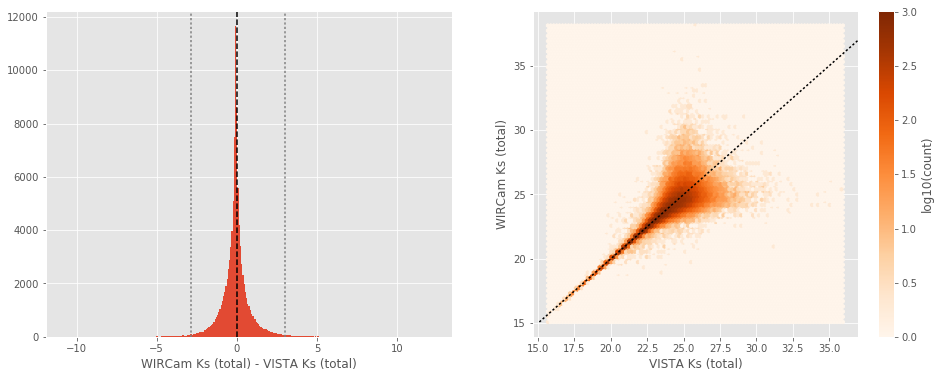

UKIDSS K (aperture) - VISTA Ks (aperture):
- Median: -0.14
- Median Absolute Deviation: 0.08
- 1% percentile: -0.6760104179382325
- 99% percentile: 0.21462045669555654


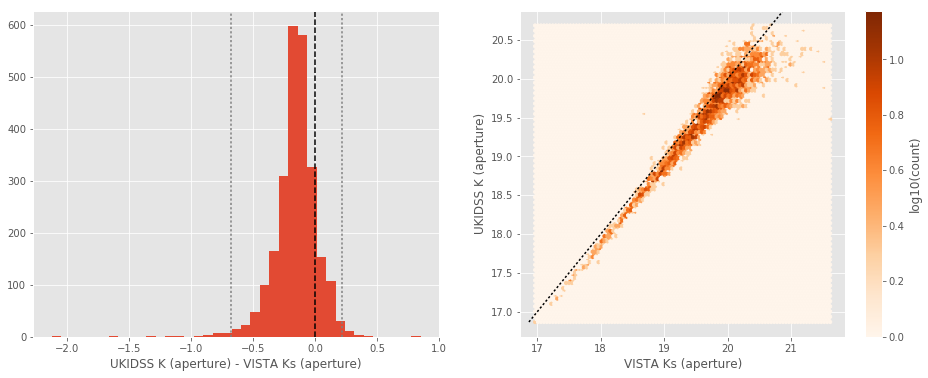

UKIDSS K (total) - VISTA Ks (total):
- Median: 0.14
- Median Absolute Deviation: 0.17
- 1% percentile: -0.7201595306396484
- 99% percentile: 1.1736278533935547


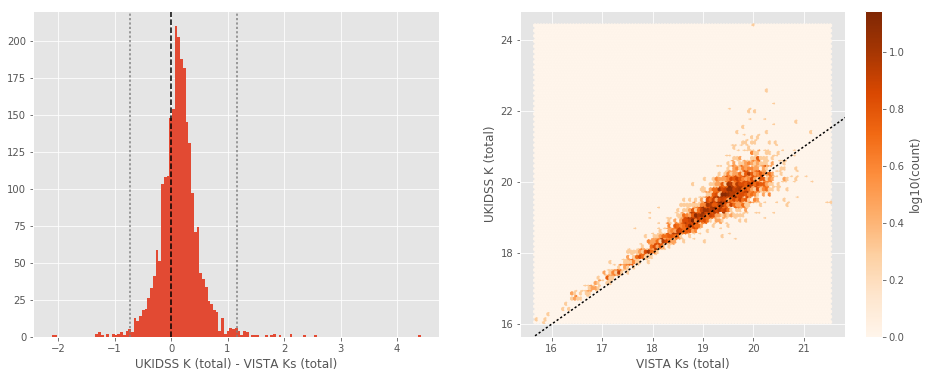

UKIDSS K (aperture) - WIRCam Ks (aperture):
- Median: -0.08
- Median Absolute Deviation: 0.07
- 1% percentile: -0.6827116394042968
- 99% percentile: 0.2704983520507816


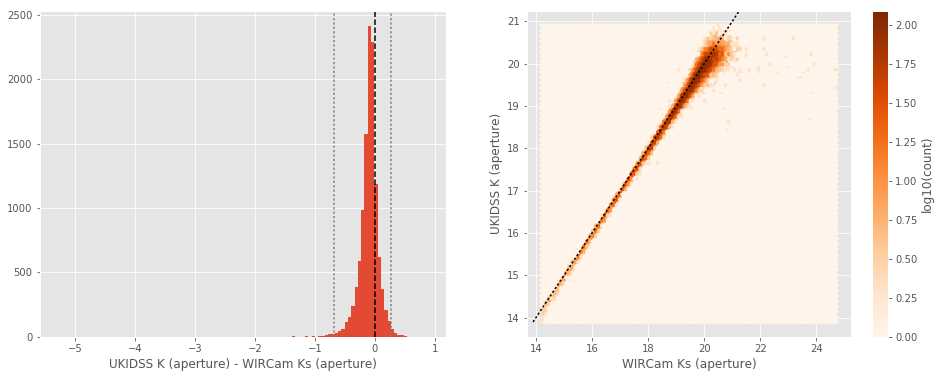

UKIDSS K (total) - WIRCam Ks (total):
- Median: 0.14
- Median Absolute Deviation: 0.14
- 1% percentile: -0.9003155517578125
- 99% percentile: 1.1899562072753906


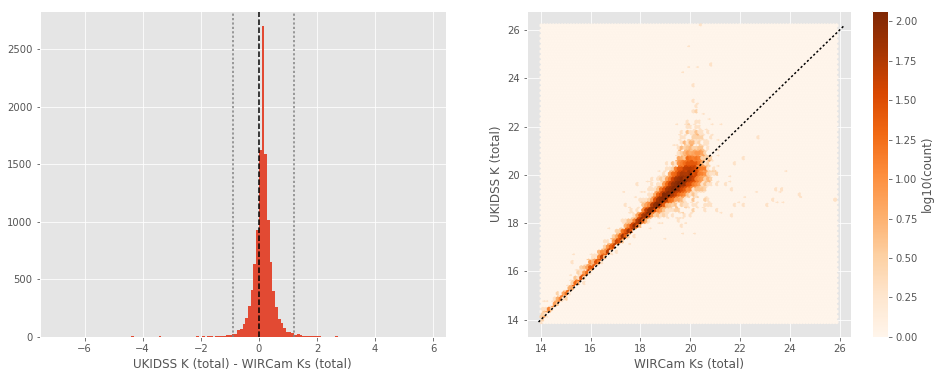

In [10]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, j_bands, h_bands, k_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):
        
        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (total)".format(band1), "{} (total)".format(band2)))

## III - Comparing magnitudes to reference bands

Cross-match the master list to SDSS and 2MASS to compare its magnitudes to SDSS and 2MASS ones.

In [11]:
master_catalogue_coords = SkyCoord(master_catalogue['ra'], master_catalogue['dec'])

### III.a - Comparing u, g, r, i, and z bands to SDSS

The catalogue is cross-matched to SDSS-DR13 withing 0.2 arcsecond. 

We compare the u, g, r, i, and z magnitudes to those from SDSS using `fiberMag` for the aperture magnitude and `petroMag`  for the total magnitude.

In [12]:
sdss = Table.read("../../dmu0/dmu0_SDSS-DR13/data/SDSS-DR13_COSMOS.fits")
sdss_coords = SkyCoord(sdss['ra'] * u.deg, sdss['dec'] * u.deg)

idx, d2d, _ = sdss_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

sdss = sdss[mask]
ml_sdss_idx = idx[mask]

Megacam u (aperture) - SDSS u (fiberMag):
- Median: 0.18
- Median Absolute Deviation: 0.54
- 1% percentile: -1.6622724533081055
- 99% percentile: 3.217677116394043


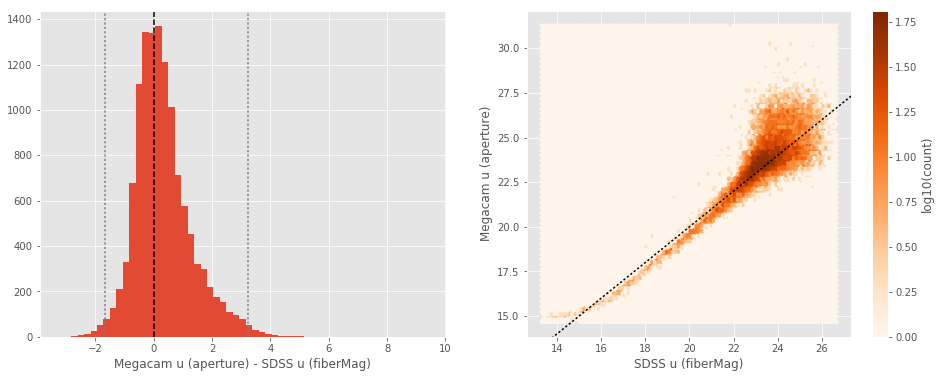

Megacam u (total) - SDSS u (petroMag):
- Median: 0.09
- Median Absolute Deviation: 0.84
- 1% percentile: -4.217063903808594
- 99% percentile: 4.260936737060548


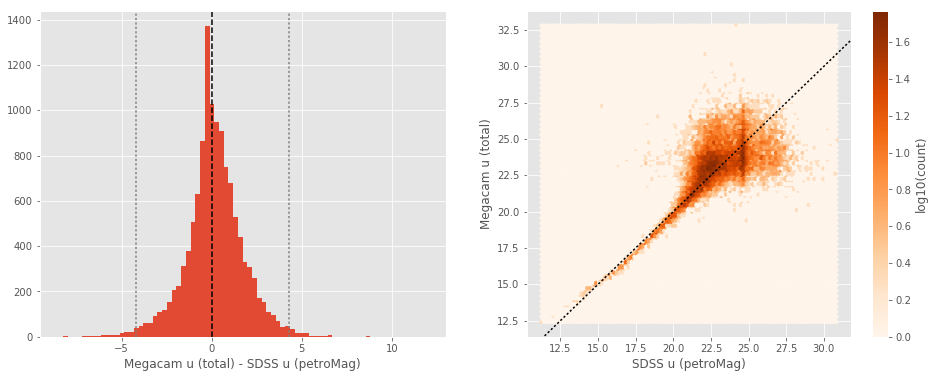

OMEGACam u (aperture) - SDSS u (fiberMag):
- Median: 0.11
- Median Absolute Deviation: 0.44
- 1% percentile: -1.6003692245483399
- 99% percentile: 3.0377160072326657


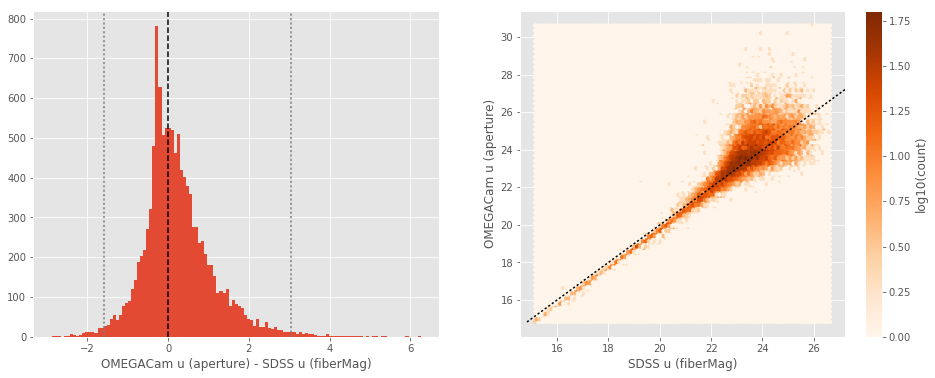

OMEGACam u (total) - SDSS u (petroMag):
- Median: 0.27
- Median Absolute Deviation: 0.78
- 1% percentile: -4.16860481262207
- 99% percentile: 4.67288856506347


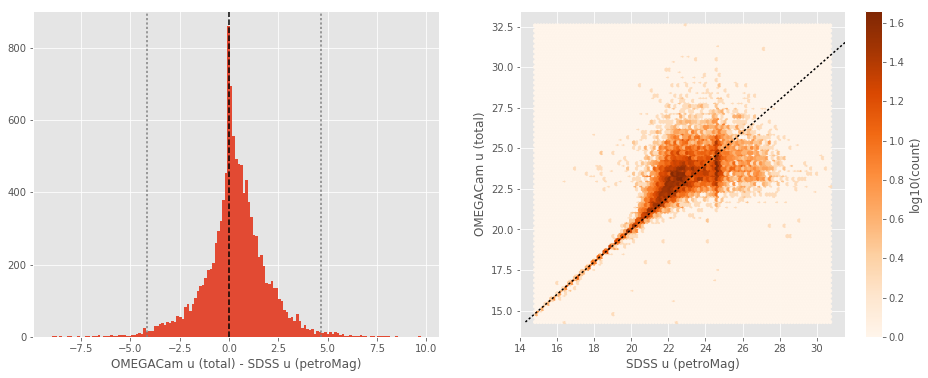

Megacam g (aperture) - SDSS g (fiberMag):
- Median: -0.16
- Median Absolute Deviation: 0.17
- 1% percentile: -1.0304053878784178
- 99% percentile: 0.8484426879882825


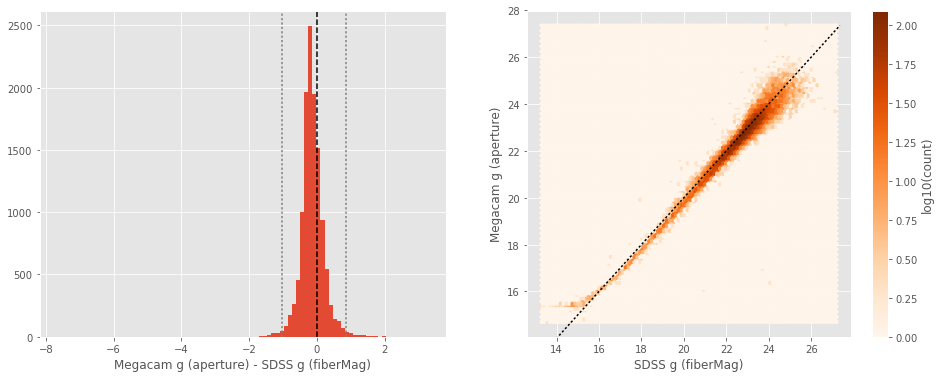

Megacam g (total) - SDSS g (petroMag):
- Median: -0.15
- Median Absolute Deviation: 0.24
- 1% percentile: -3.7374807739257814
- 99% percentile: 1.3863742065429707


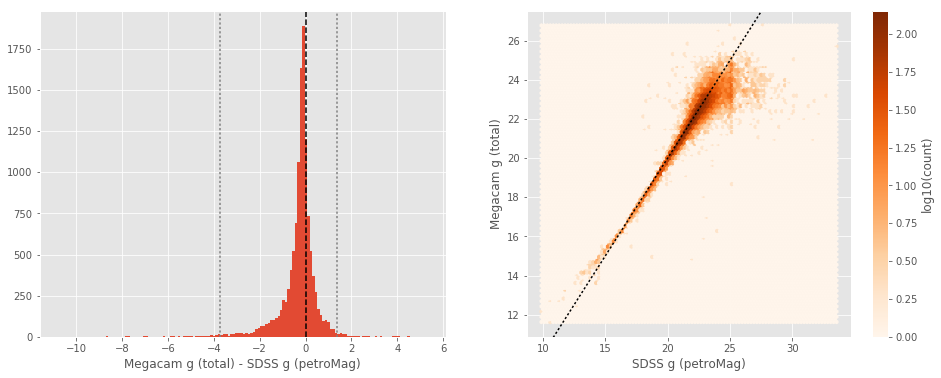

DECam g (aperture) - SDSS g (fiberMag):
- Median: -0.46
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1927812957763673
- 99% percentile: 1.125278091430665


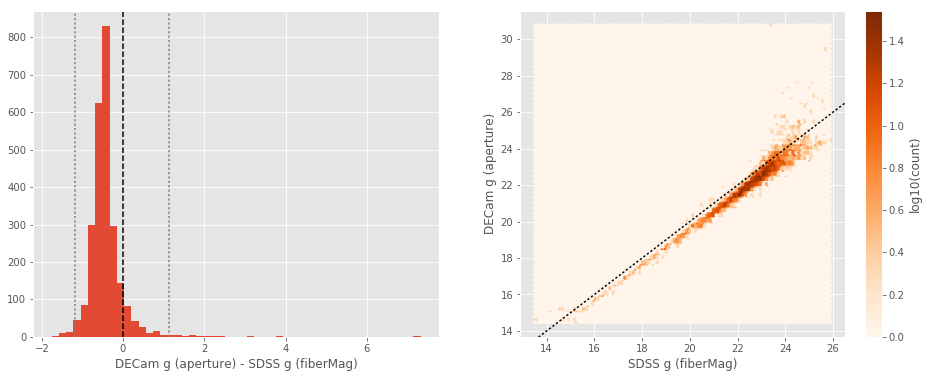

DECam g (total) - SDSS g (petroMag):
- Median: -0.09
- Median Absolute Deviation: 0.24
- 1% percentile: -3.593895053863525
- 99% percentile: 1.6018821716308569


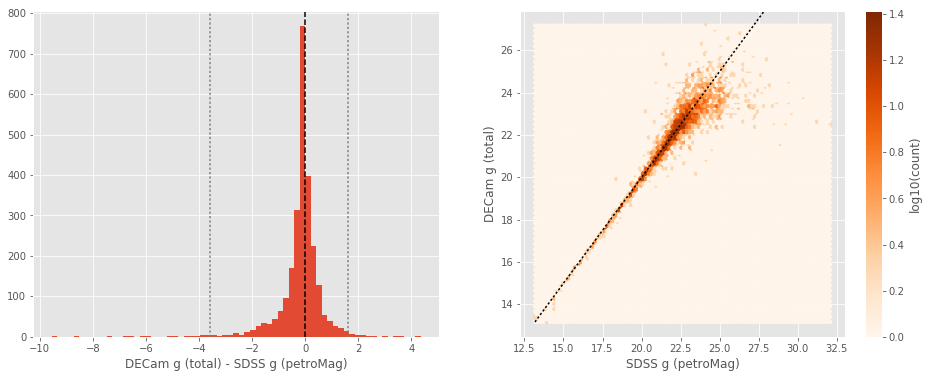

OMEGACam g (aperture) - SDSS g (fiberMag):
- Median: -0.15
- Median Absolute Deviation: 0.15
- 1% percentile: -0.9420113372802734
- 99% percentile: 1.00976463317871


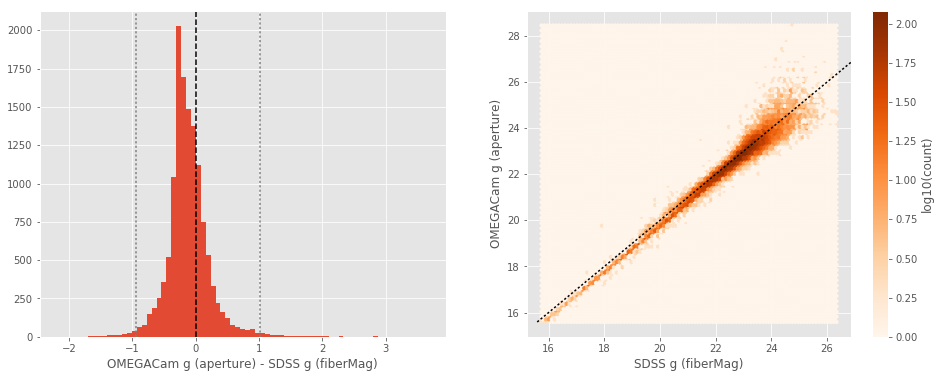

OMEGACam g (total) - SDSS g (petroMag):
- Median: 0.08
- Median Absolute Deviation: 0.24
- 1% percentile: -3.282929229736328
- 99% percentile: 2.0535419464111344


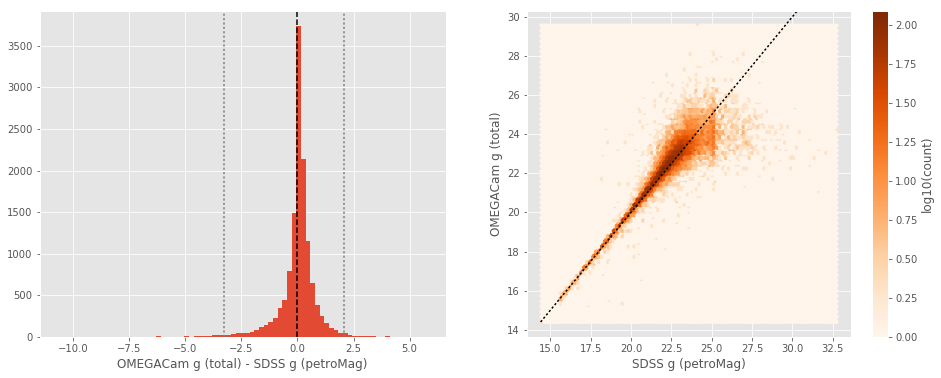

SUPRIME g (aperture) - SDSS g (fiberMag):
- Median: -0.24
- Median Absolute Deviation: 0.17
- 1% percentile: -0.9181962013244629
- 99% percentile: 16.61163568496704


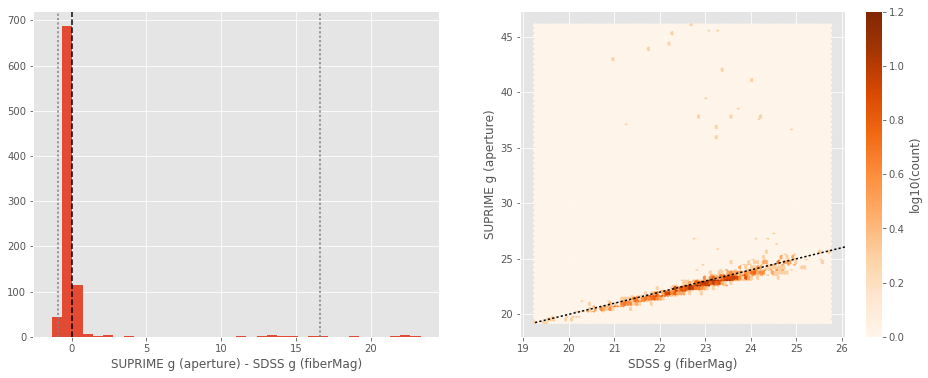

SUPRIME g (total) - SDSS g (petroMag):
- Median: -0.08
- Median Absolute Deviation: 0.25
- 1% percentile: -2.587129592895508
- 99% percentile: 8.72717361450182


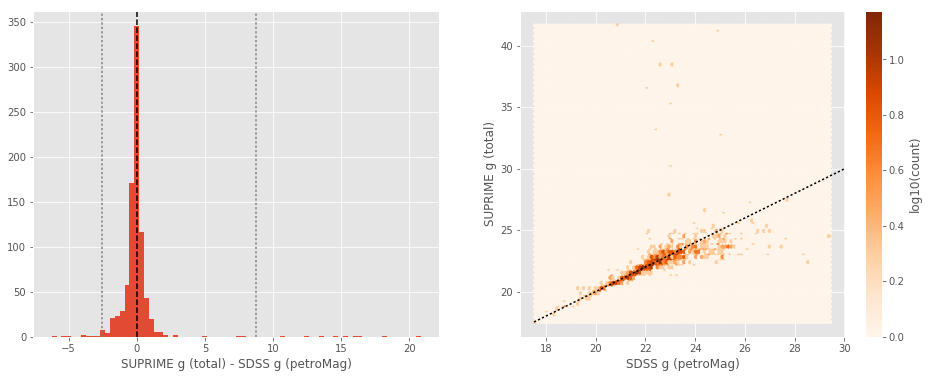

GPC1 g (aperture) - SDSS g (fiberMag):
- Median: -0.50
- Median Absolute Deviation: 0.26
- 1% percentile: -2.4683144760131834
- 99% percentile: 2.0133354949951094


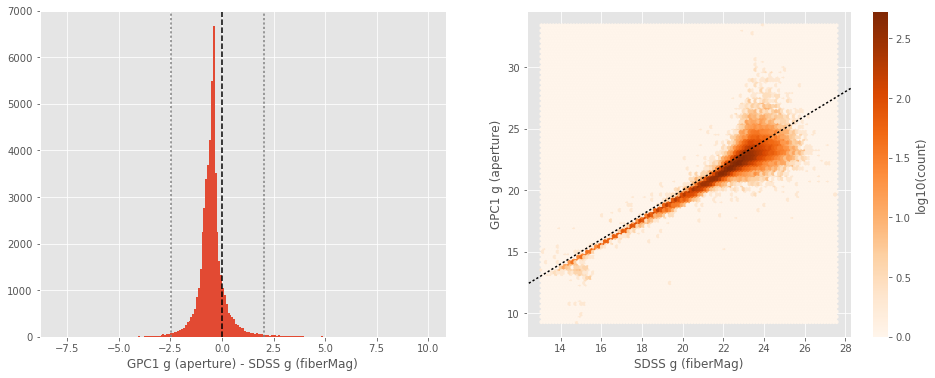

GPC1 g (total) - SDSS g (petroMag):
- Median: -0.09
- Median Absolute Deviation: 0.28
- 1% percentile: -4.308210144042969
- 99% percentile: 1.891873703002936


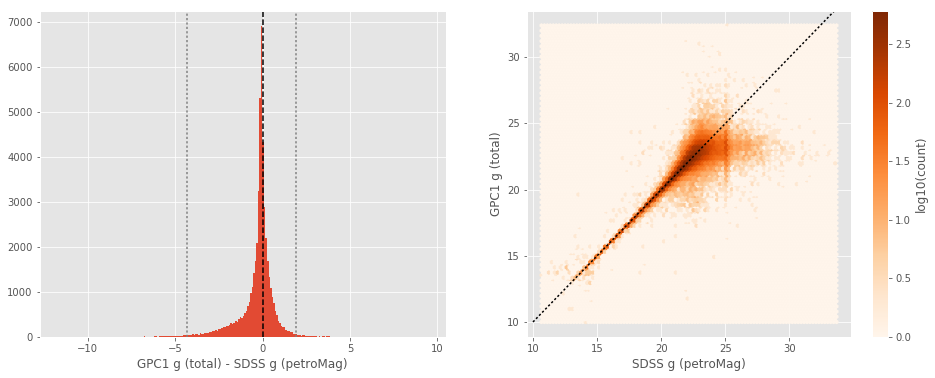

Megacam r (aperture) - SDSS r (fiberMag):
- Median: -0.11
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8578680038452149
- 99% percentile: 0.5822653293609616


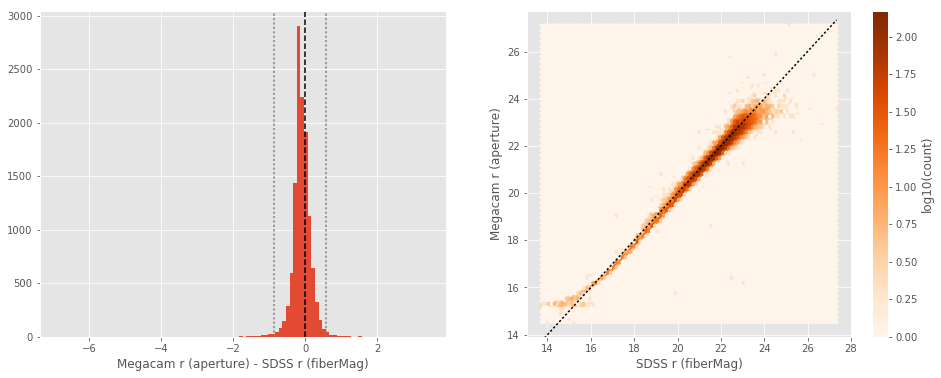

Megacam r (total) - SDSS r (petroMag):
- Median: -0.05
- Median Absolute Deviation: 0.15
- 1% percentile: -3.109827880859375
- 99% percentile: 1.1080525398254348


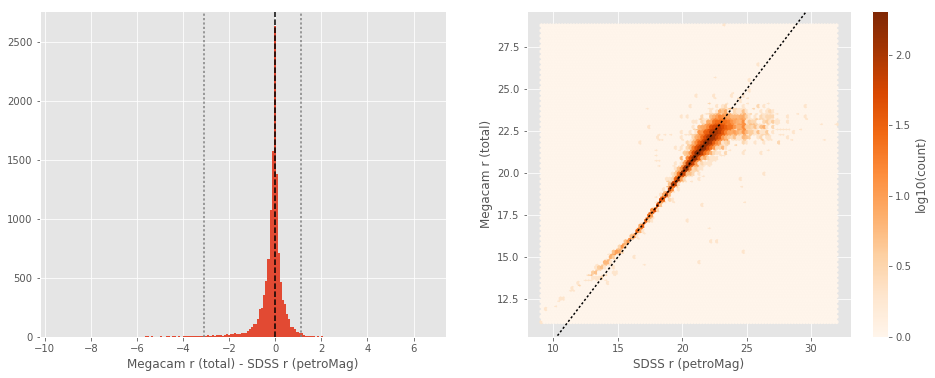

DECam r (aperture) - SDSS r (fiberMag):
- Median: -0.55
- Median Absolute Deviation: 0.12
- 1% percentile: -1.1718390274047852
- 99% percentile: 0.35935024261474535


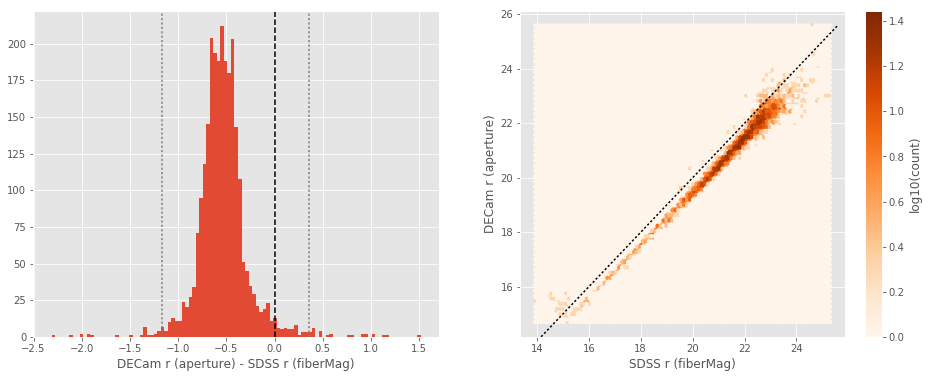

DECam r (total) - SDSS r (petroMag):
- Median: -0.15
- Median Absolute Deviation: 0.16
- 1% percentile: -2.351560478210449
- 99% percentile: 1.0791486358642564


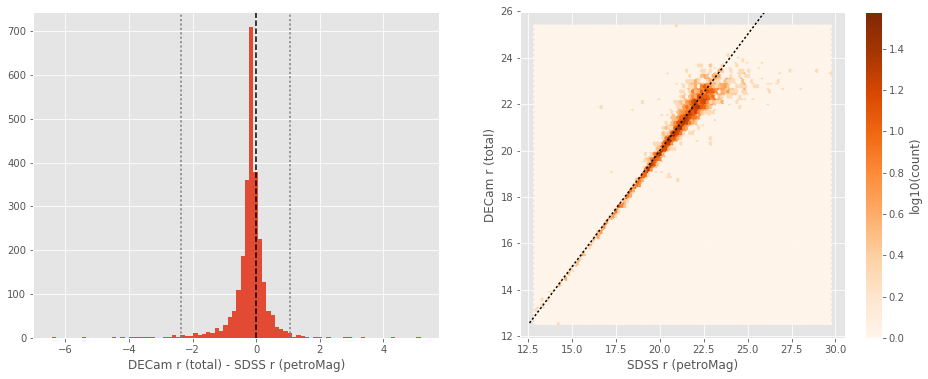

OMEGACam r (aperture) - SDSS r (fiberMag):
- Median: -0.25
- Median Absolute Deviation: 0.12
- 1% percentile: -0.968523063659668
- 99% percentile: 0.3649759674072269


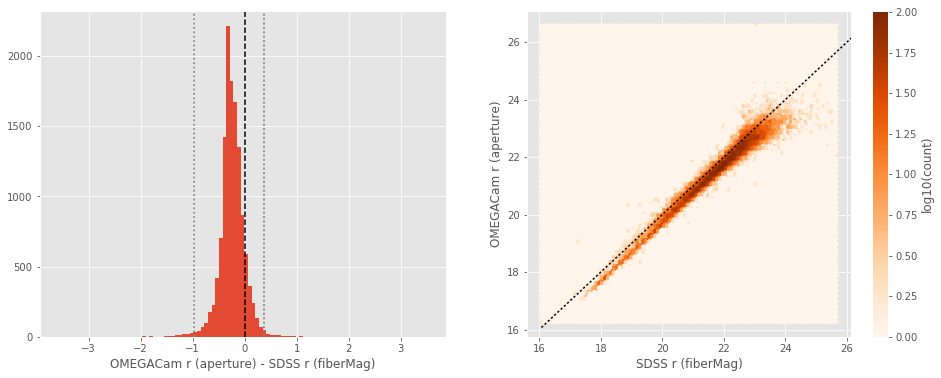

OMEGACam r (total) - SDSS r (petroMag):
- Median: -0.01
- Median Absolute Deviation: 0.16
- 1% percentile: -2.923204460144043
- 99% percentile: 1.2081870269775392


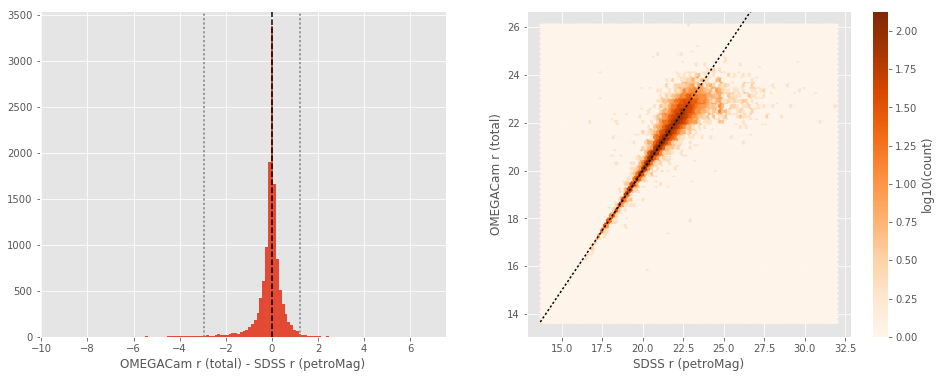

SUPRIME r (aperture) - SDSS r (fiberMag):
- Median: -0.26
- Median Absolute Deviation: 0.13
- 1% percentile: -0.937751293182373
- 99% percentile: 17.427645683288574


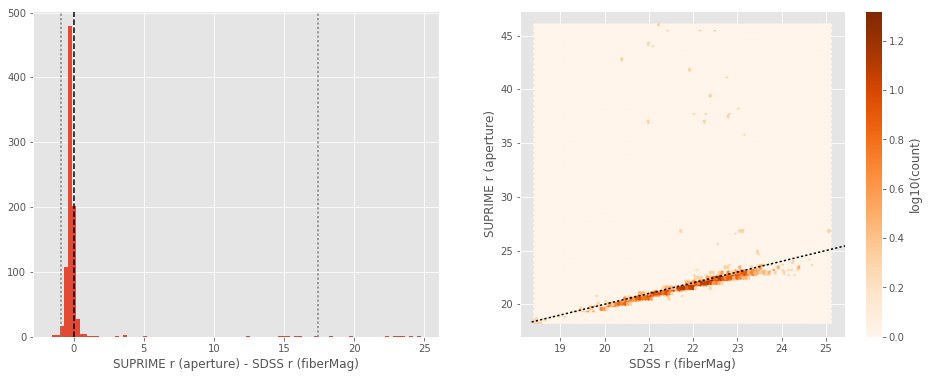

SUPRIME r (total) - SDSS r (petroMag):
- Median: -0.09
- Median Absolute Deviation: 0.19
- 1% percentile: -2.1363064002990724
- 99% percentile: 6.321401538848686


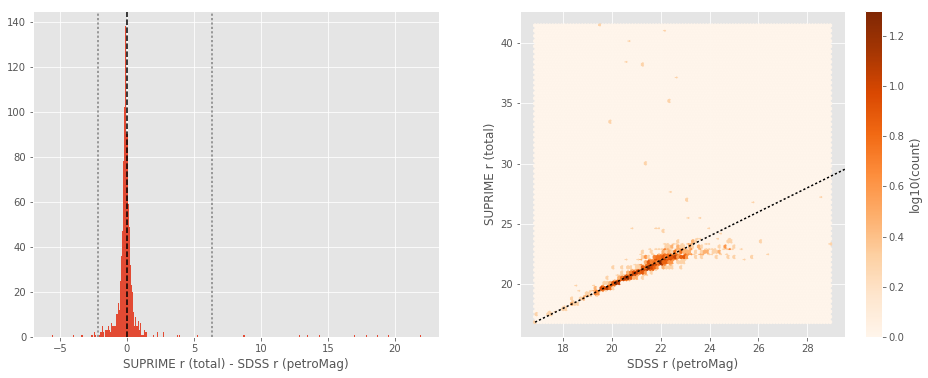

GPC1 r (aperture) - SDSS r (fiberMag):
- Median: -0.39
- Median Absolute Deviation: 0.16
- 1% percentile: -1.5071748733520507
- 99% percentile: 0.9811979866027818


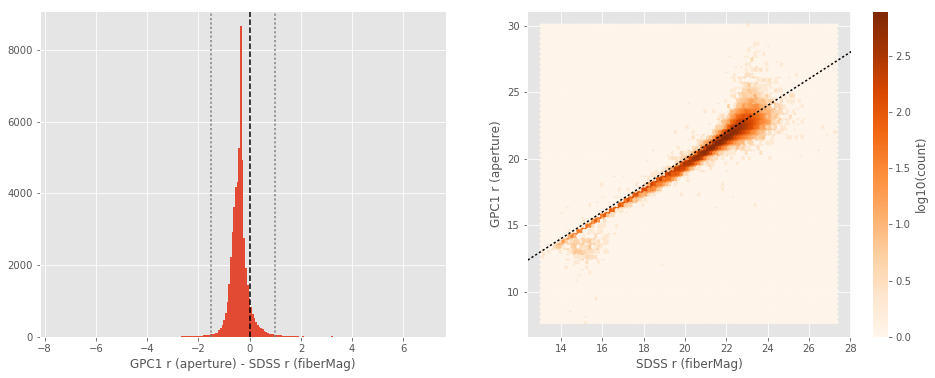

GPC1 r (total) - SDSS r (petroMag):
- Median: 0.03
- Median Absolute Deviation: 0.15
- 1% percentile: -2.9415142822265627
- 99% percentile: 1.3889632415771487


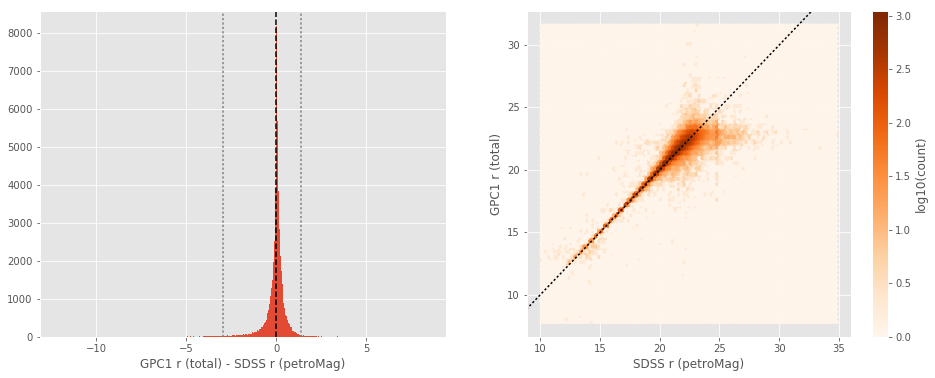

Megacam i (aperture) - SDSS i (fiberMag):
- Median: -0.17
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8326692390441894
- 99% percentile: 0.6983036422729465


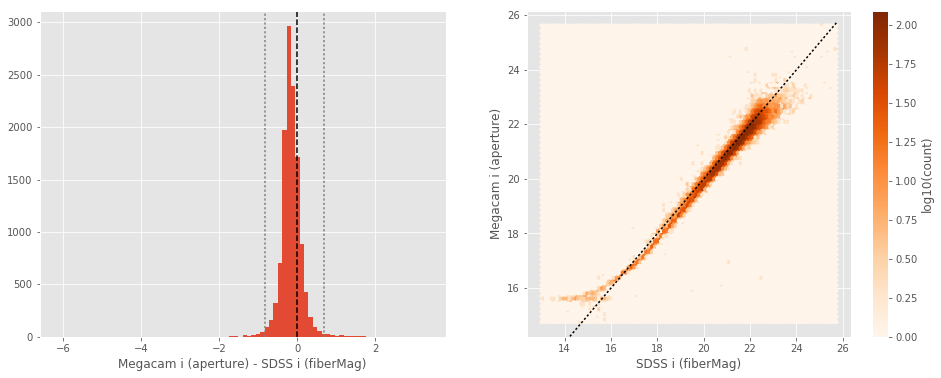

Megacam i (total) - SDSS i (petroMag):
- Median: -0.10
- Median Absolute Deviation: 0.16
- 1% percentile: -3.780448150634766
- 99% percentile: 1.1449605560302731


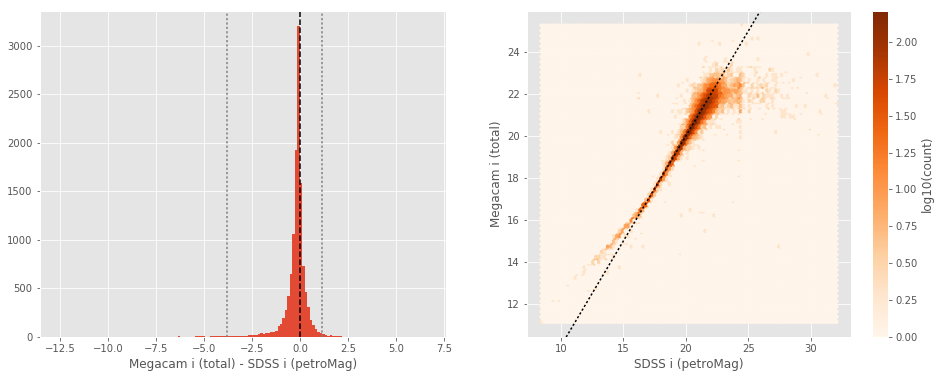

OMEGACam i (aperture) - SDSS i (fiberMag):
- Median: -0.23
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8875168800354003
- 99% percentile: 0.48121500015258817


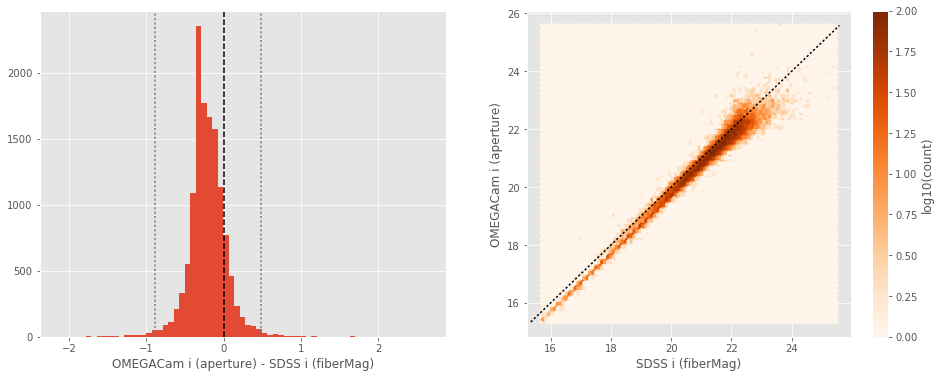

OMEGACam i (total) - SDSS i (petroMag):
- Median: 0.03
- Median Absolute Deviation: 0.17
- 1% percentile: -3.4275055313110347
- 99% percentile: 1.3472866821289071


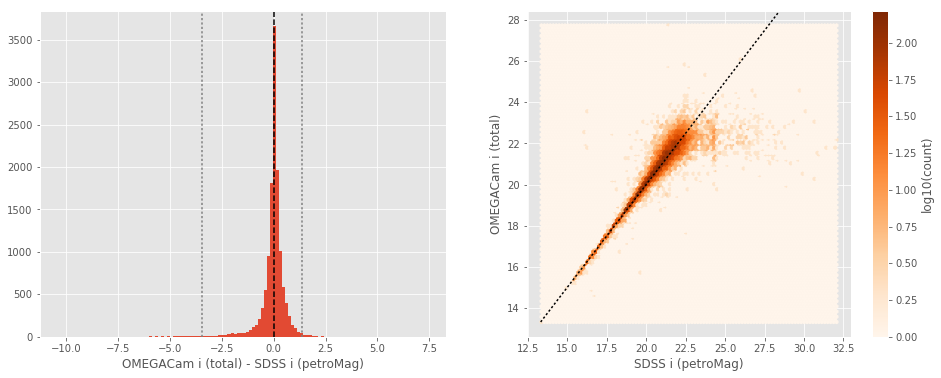

SUPRIME i (aperture) - SDSS i (fiberMag):
- Median: -0.27
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9130089759826661
- 99% percentile: 0.5842765998840325


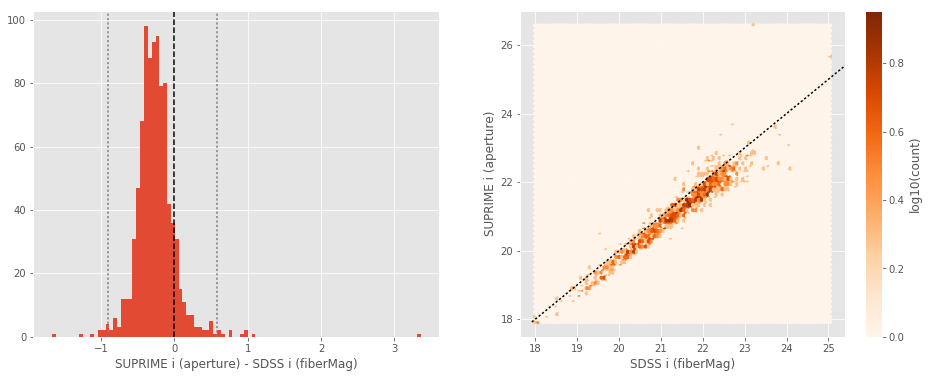

SUPRIME i (total) - SDSS i (petroMag):
- Median: -0.10
- Median Absolute Deviation: 0.18
- 1% percentile: -3.2372421455383305
- 99% percentile: 1.059034538269042


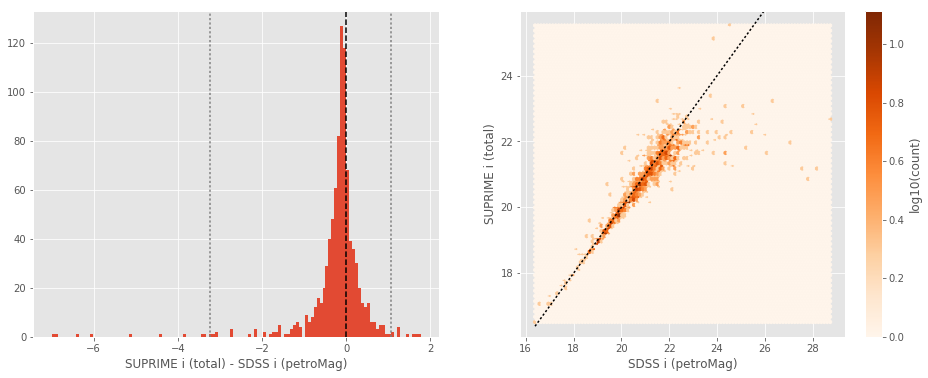

GPC1 i (aperture) - SDSS i (fiberMag):
- Median: -0.39
- Median Absolute Deviation: 0.13
- 1% percentile: -1.1904735565185547
- 99% percentile: 0.5435258483886686


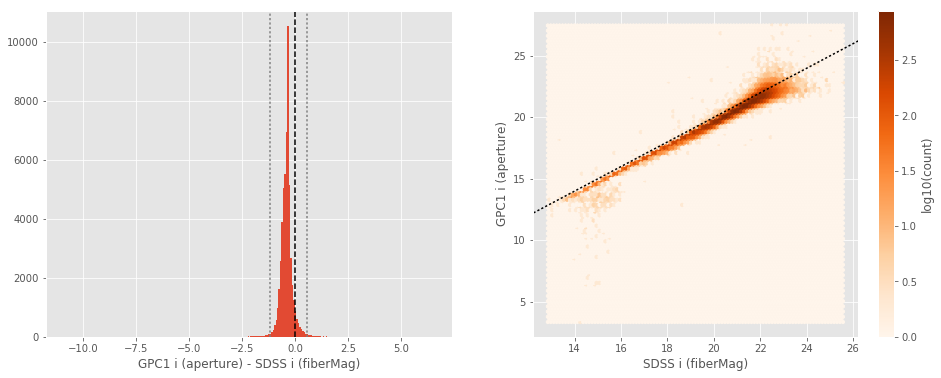

GPC1 i (total) - SDSS i (petroMag):
- Median: 0.05
- Median Absolute Deviation: 0.14
- 1% percentile: -3.208597984313965
- 99% percentile: 1.1324512481689457


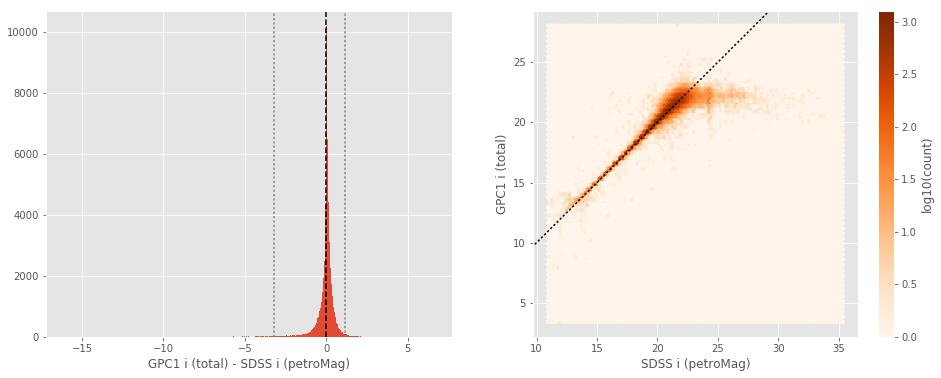

Megacam z (aperture) - SDSS z (fiberMag):
- Median: -0.07
- Median Absolute Deviation: 0.21
- 1% percentile: -1.402605972290039
- 99% percentile: 1.134657783508301


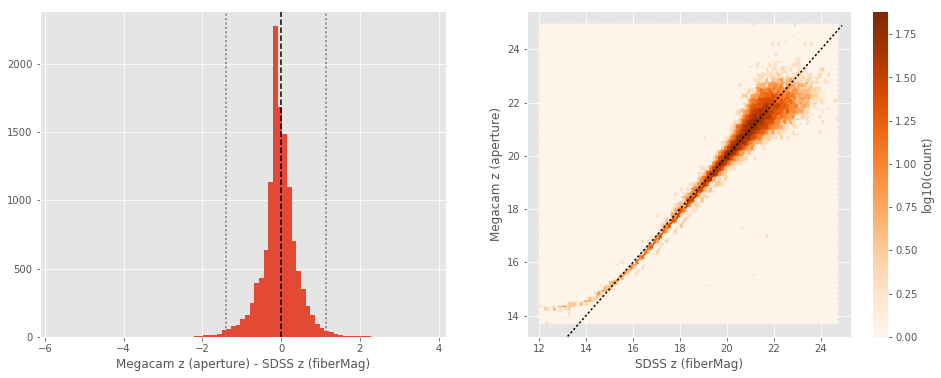

Megacam z (total) - SDSS z (petroMag):
- Median: -0.04
- Median Absolute Deviation: 0.41
- 1% percentile: -4.57513801574707
- 99% percentile: 1.84838706970215


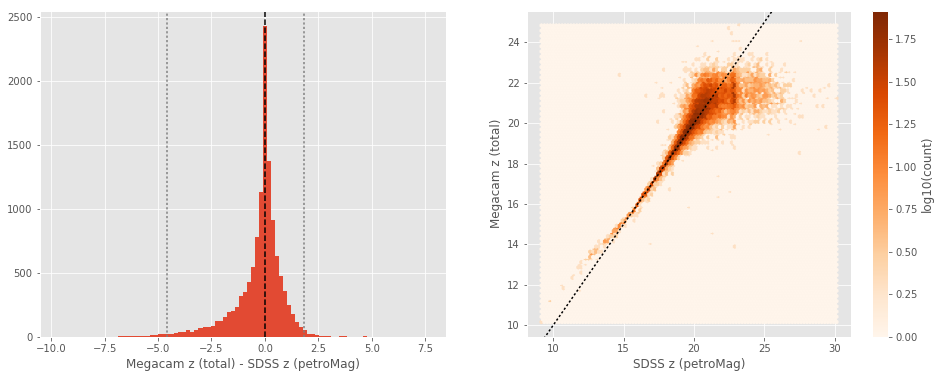

No sources have both SDSS z (fiberMag) and DECam z (aperture) values.
DECam z (total) - SDSS z (petroMag):
- Median: -0.12
- Median Absolute Deviation: 0.42
- 1% percentile: -4.532157955169677
- 99% percentile: 1.9360119056701648


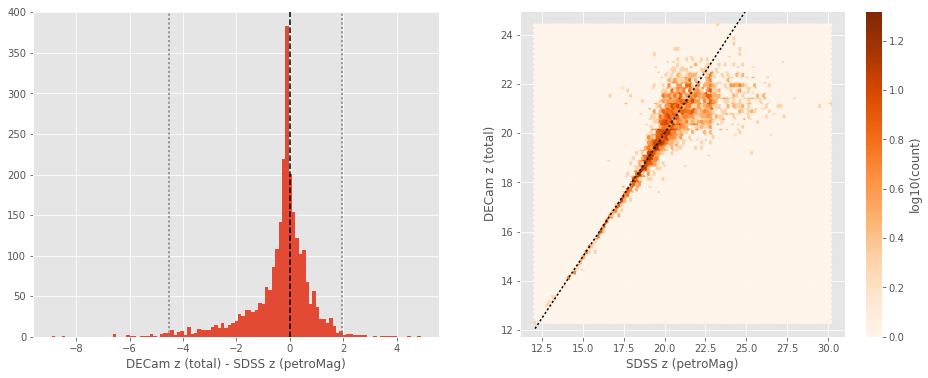

SUPRIME z (aperture) - SDSS z (fiberMag):
- Median: -0.19
- Median Absolute Deviation: 0.24
- 1% percentile: -1.6903525924682616
- 99% percentile: 1.0965424919128413


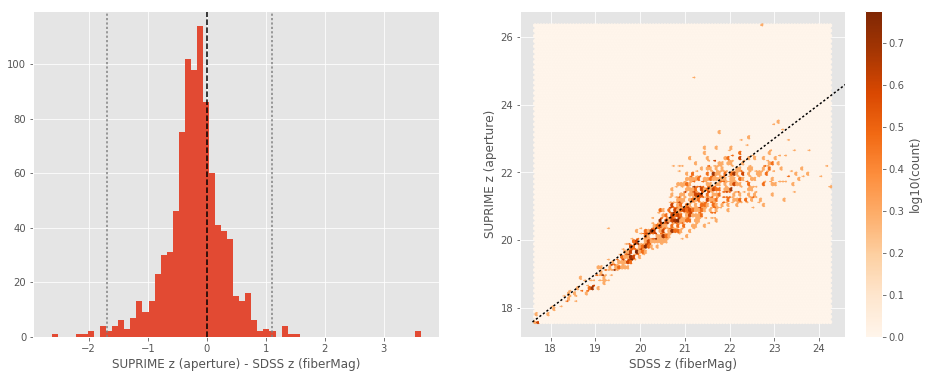

SUPRIME z (total) - SDSS z (petroMag):
- Median: -0.10
- Median Absolute Deviation: 0.51
- 1% percentile: -4.6577224540710445
- 99% percentile: 2.137278537750244


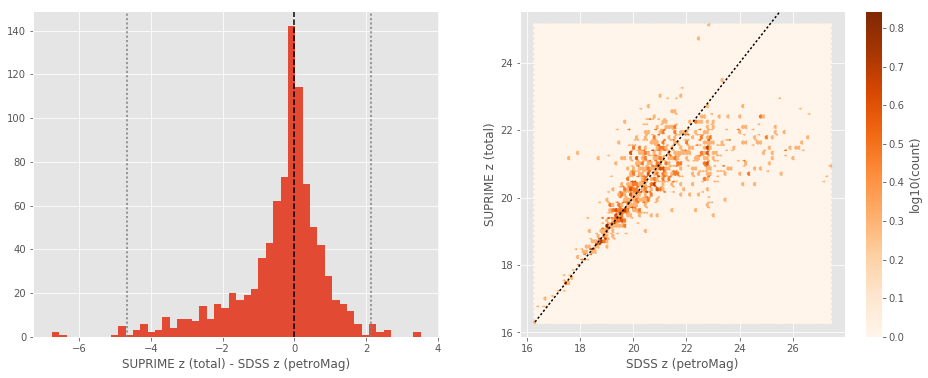

GPC1 z (aperture) - SDSS z (fiberMag):
- Median: -0.30
- Median Absolute Deviation: 0.19
- 1% percentile: -1.600010871887207
- 99% percentile: 1.2000317573547363


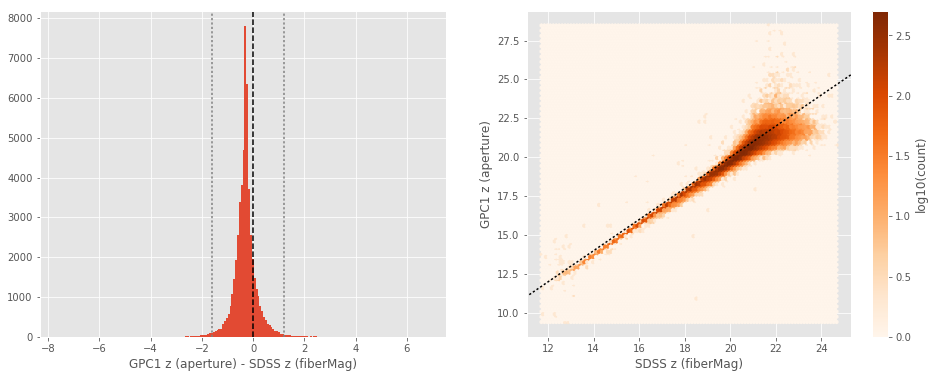

GPC1 z (total) - SDSS z (petroMag):
- Median: 0.10
- Median Absolute Deviation: 0.31
- 1% percentile: -4.156397819519043
- 99% percentile: 1.9282426834106445


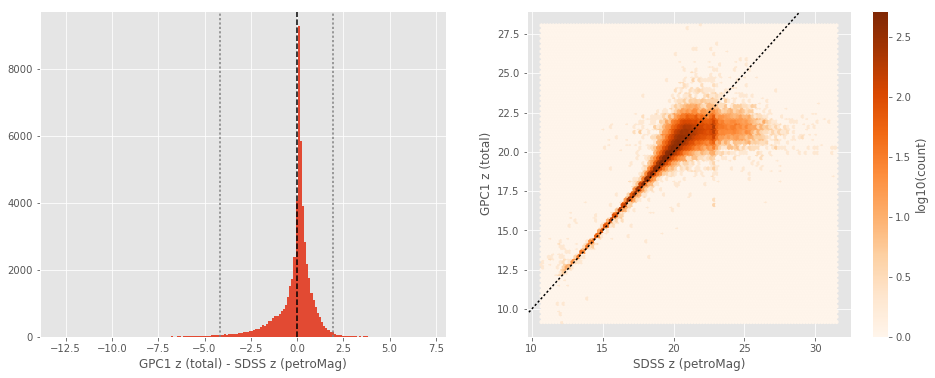

In [13]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands]:
    for band in band_of_a_kind:
        
        sdss_mag_ap = sdss["fiberMag_{}".format(band[-1])]
        master_cat_mag_ap = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
    
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (fiberMag)".format(band[-1]), "{} (aperture)".format(band)))
    
        sdss_mag_tot = sdss["petroMag_{}".format(band[-1])]
        master_cat_mag_tot = master_catalogue["m_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
        
        nb_compare_mags(sdss_mag_tot, master_cat_mag_tot,
                        labels=("SDSS {} (petroMag)".format(band[-1]), "{} (total)".format(band)))

### III.b - Comparing J and K bands to 2MASS

The catalogue is cross-matched to 2MASS-PSC withing 0.2 arcsecond. We compare the UKIDSS total J and K magnitudes to those from 2MASS.

The 2MASS magnitudes are “*Vega-like*” and we have to convert them to AB magnitudes using the zero points provided on [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4a.html):

| Band | Fν - 0 mag (Jy) |
|------|-----------------|
| J    | 1594            |
| H    | 1024            |
| Ks   | 666.7           |

In addition, UKIDSS uses a K band whereas 2MASS uses a Ks (“short”) band, [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4b.html) give a correction to convert the K band in a Ks band with the formula:

$$K_{s(2MASS)} = K_{UKIRT} + 0.003 + 0.004 * (J−K)_{UKIRT}$$

In [14]:
# The AB zero point is 3631 Jy
j_2mass_to_ab = 2.5 * np.log10(3631/1595)
k_2mass_to_ab = 2.5 * np.log10(3631/666.7)

In [15]:
twomass = Table.read("../../dmu0/dmu0_2MASS-point-sources/data/2MASS-PSC_COSMOS.fits")
twomass_coords = SkyCoord(twomass['raj2000'], twomass['dej2000'])

idx, d2d, _ = twomass_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

twomass = twomass[mask]
ml_twomass_idx = idx[mask]

UKIDSS J (total) - 2MASS J:
- Median: 0.05
- Median Absolute Deviation: 0.05
- 1% percentile: -0.690306640386756
- 99% percentile: 0.6158277497957391


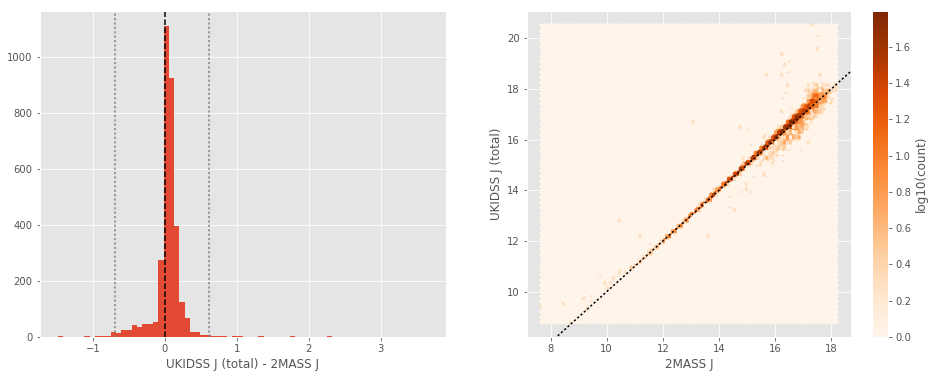

In [16]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_ukidss_j'][ml_twomass_idx],
                labels=("2MASS J", "UKIDSS J (total)"))

UKIDSS Ks-like (total) - 2MASS Ks:
- Median: 0.11
- Median Absolute Deviation: 0.08
- 1% percentile: -0.7126119068010858
- 99% percentile: 0.9039365552655615


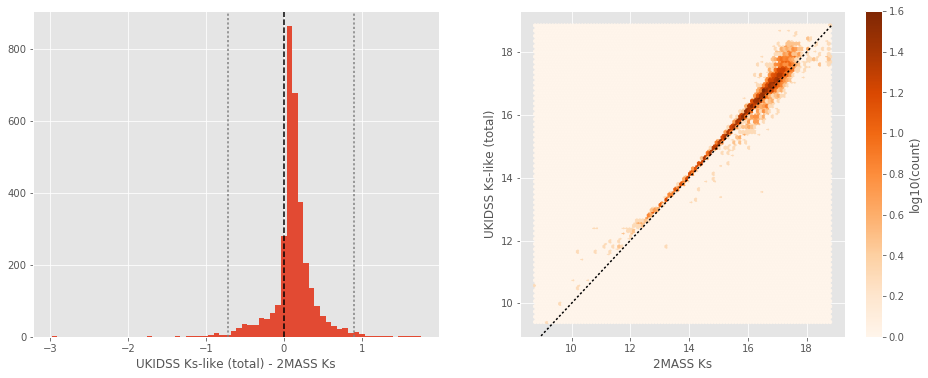

In [17]:
ukidss_ks_like = master_catalogue['m_ukidss_k'] + 0.003 + 0.004 * (
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'])
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, ukidss_ks_like[ml_twomass_idx],
                labels=("2MASS Ks", "UKIDSS Ks-like (total)"))

VISTA J (total) - 2MASS J:
- Median: -0.01
- Median Absolute Deviation: 0.05
- 1% percentile: -0.771601964712317
- 99% percentile: 0.3178845297334829


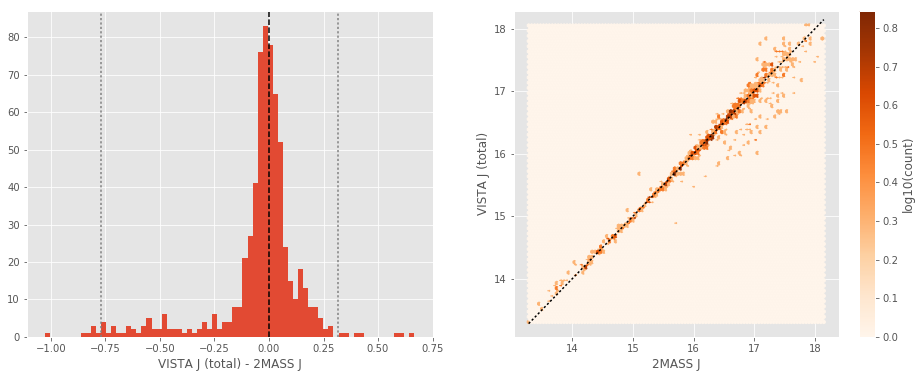

In [18]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_wircam_j'][ml_twomass_idx],
                labels=("2MASS J", "VISTA J (total)"))

VISTA Ks (total) - 2MASS Ks:
- Median: 0.00
- Median Absolute Deviation: 0.09
- 1% percentile: -1.045319703431944
- 99% percentile: 0.7428247107831432


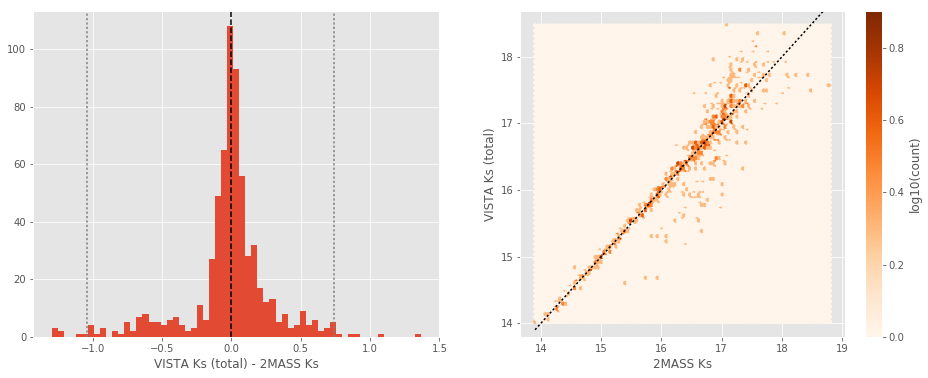

In [19]:
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, master_catalogue['m_wircam_ks'][ml_twomass_idx],
                labels=("2MASS Ks", "VISTA Ks (total)"))

## IV - Comparing aperture magnitudes to total ones.

Number of source used: 139647 / 462850 (30.17%)


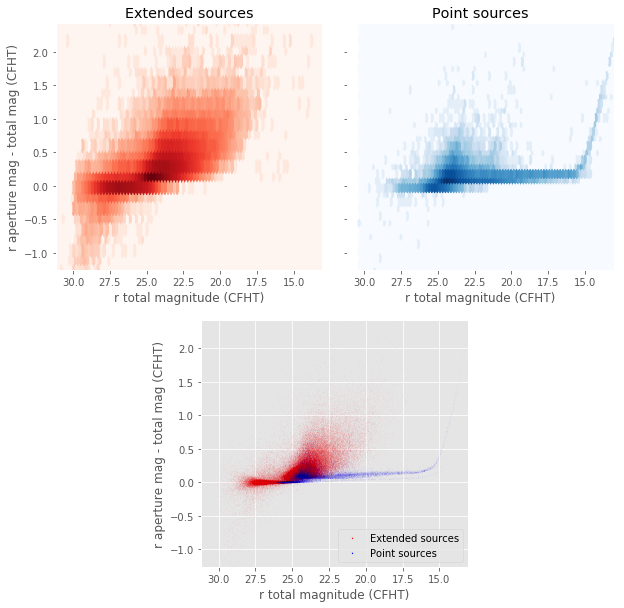

In [20]:
nb_ccplots(
    master_catalogue['m_megacam_r'],
    master_catalogue['m_ap_megacam_r'] - master_catalogue['m_megacam_r'],
    "r total magnitude (CFHT)", "r aperture mag - total mag (CFHT)",
    master_catalogue["stellarity"],
    invert_x=True
)

## V - Color-color and magnitude-color plots

Number of source used: 393 / 462850 (0.08%)


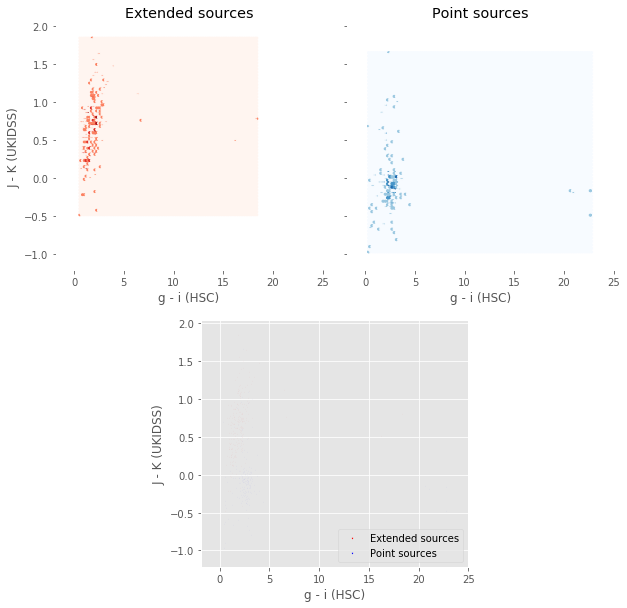

In [21]:
nb_ccplots(
    master_catalogue['m_suprime_g'] - master_catalogue['m_suprime_i'],
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    "g - i (HSC)", "J - K (UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 10465 / 462850 (2.26%)


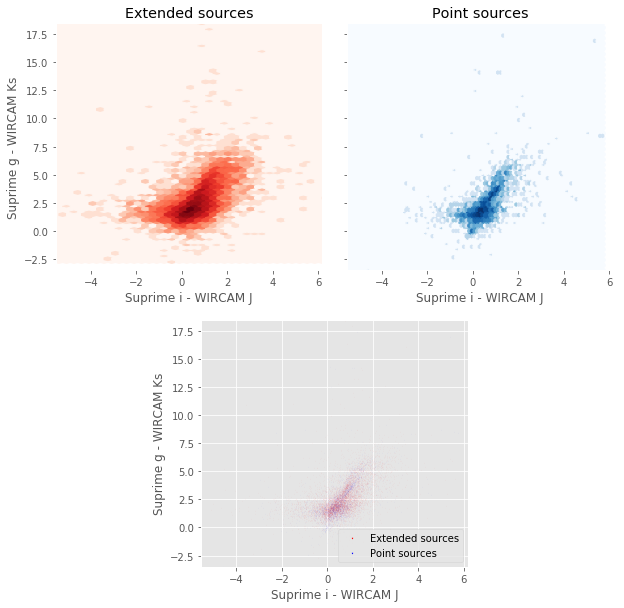

In [22]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_wircam_j'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_wircam_ks'],
    "Suprime i - WIRCAM J", "Suprime g - WIRCAM Ks",
    master_catalogue["stellarity"]
)

Number of source used: 133128 / 462850 (28.76%)


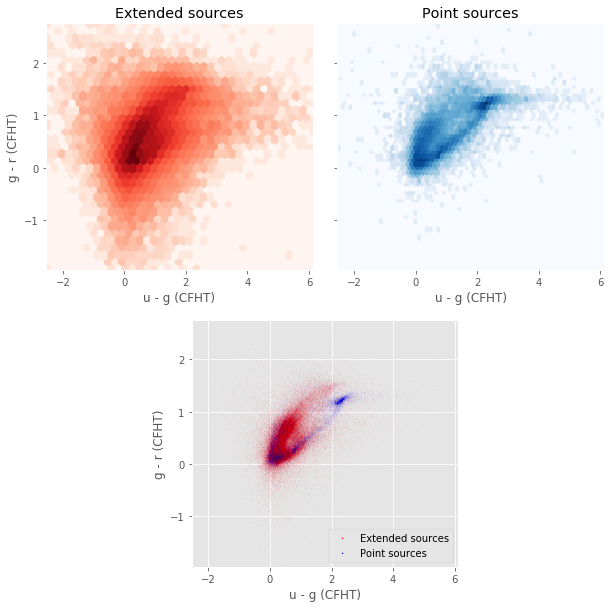

In [23]:
nb_ccplots(
    master_catalogue['m_megacam_u'] - master_catalogue['m_megacam_g'],
    master_catalogue['m_megacam_g'] - master_catalogue['m_megacam_r'],
    "u - g (CFHT)", "g - r (CFHT)",
    master_catalogue["stellarity"]
)

Number of source used: 393 / 462850 (0.08%)


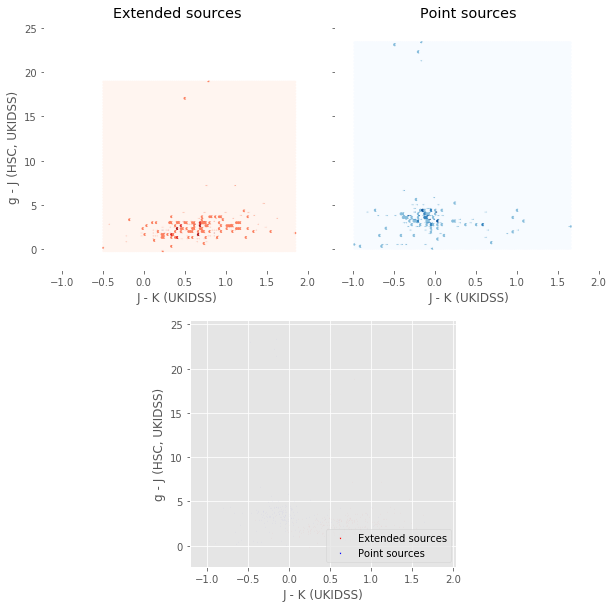

In [24]:
nb_ccplots(
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_ukidss_j'],
    "J - K (UKIDSS)", "g - J (HSC, UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 464 / 462850 (0.10%)


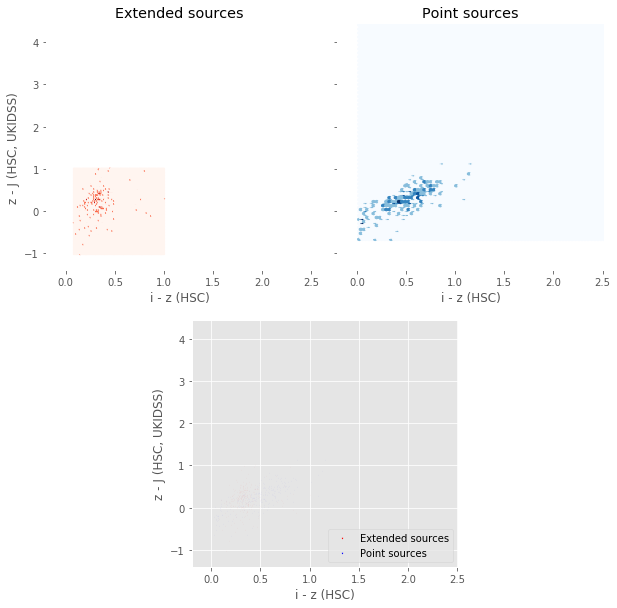

In [25]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_suprime_z'],
    master_catalogue['m_suprime_z'] - master_catalogue['m_ukidss_j'],
    "i - z (HSC)", "z - J (HSC, UKIDSS)",
    master_catalogue["stellarity"]
)